Time Series Introduction
- Time series is a series of data points indexed (or listed or graphed) in time order.
- Can be indexed by day/week/month/etc


In [1]:
import matplotlib.pyplot as plt  # plots
import numpy as np  # vectors and matrices
import pandas as pd  # tables and data manipulations
import seaborn as sns  # more plotsA

sns.set()

import warnings  
from itertools import product  # some useful functions

import scipy.stats as scs
import statsmodels.api as sm
import statsmodels.formula.api as smf  # statistics and econometrics
import statsmodels.tsa.api as smt
from dateutil.relativedelta import \
    relativedelta  # working with dates with style
from scipy.optimize import minimize  # for function minimization
from tqdm.notebook import tqdm

warnings.filterwarnings("ignore") # `do not disturbe` mode

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
# for Jupyter-book, we copy data from GitHub, locally, to save Internet traffic,
# you can specify the data/ folder from the root of your cloned
# https://github.com/Yorko/mlcourse.ai repo, to save Internet traffic
DATA_PATH = "https://raw.githubusercontent.com/Yorko/mlcourse.ai/master/data/"

In [3]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

ads = pd.read_csv(DATA_PATH + "ads.csv", index_col=["Time"], parse_dates=["Time"])
currency = pd.read_csv(
    DATA_PATH + "currency.csv", index_col=["Time"], parse_dates=["Time"]
)

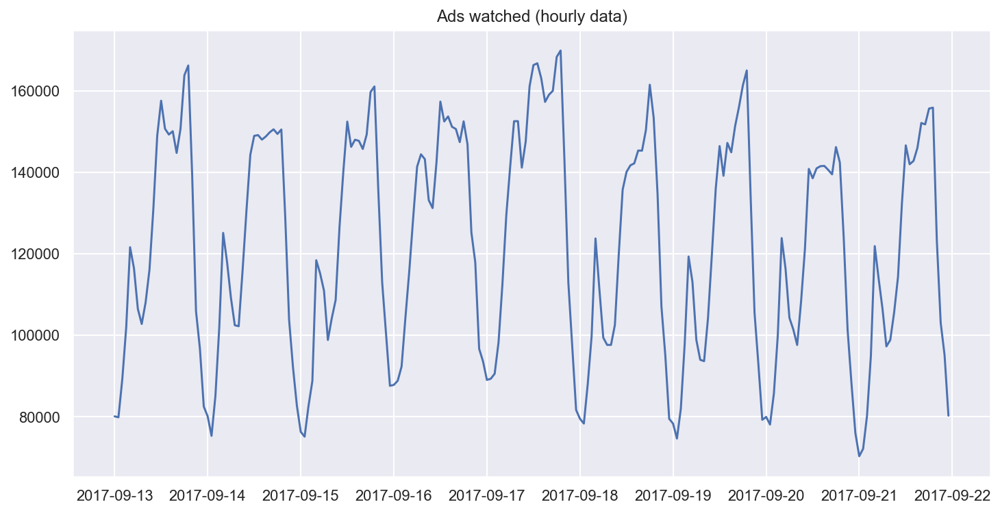

In [4]:
plt.figure(figsize=(12, 6))
plt.plot(ads.Ads)
plt.title("Ads watched (hourly data)")
plt.grid(True)
plt.show()

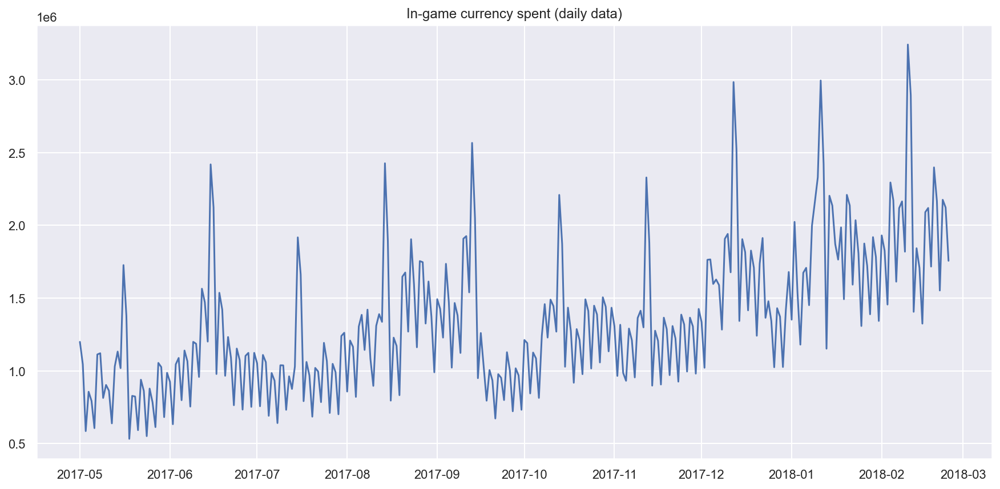

In [5]:
plt.figure(figsize=(15, 7))
plt.plot(currency.GEMS_GEMS_SPENT)
plt.title("In-game currency spent (daily data)")
plt.grid(True)
plt.show()

Forecast Quality Metrics
- R squared: coefficient of determination (econometrics, can be interpreted as percentage of variance explained by model)
    - $$R^2 = 1 - \frac{SS_{res}}{SS_{tot}}$$
    - sklearn.metrics.r2_score
- Mean Absolute Error: this is an interpretable metric because it has the same unit of measurement as the initial series [0, infinity)
    - $$MAE = \frac{\sum_{i=1}^n |{y_i-\hat{y}}|}{n} $$
    - sklearn.metrics.mean_absolute_error
- Median Absolute Error: again,  an interpretable metric that is particularly interesting because it is robust to outliers, [0+infinity)
    - $$MedAE = median(|{y_1-\hat{y_1}}|,...,{y_n-\hat{y_n}})$$
    - sklearn.metrics.median_absolute_error
- Mean Squared Error: the most commonly used metric that gives a higher penalty to large errors and vice versa, [0, +infinity)
    - $$MSE = \frac{1}{n} \sum_{i=1}^n (y_i-\hat{y_i})^2$$
- Mean Squared Logarithmic Error: same as ME, but take log of series, so give weight to small mistakes as well (used with exponental data) [0, +infinity)
    - $$MSLE = \frac{1}{n} \sum_{i=1}^n (log(1+y_i)-log(1+\hat{y_i}))^2$$
    - sklearn.metrics.mean_squared_log_error
- Mean Absolute Percentage Error: this is the same as MAE but is computed as a percentage, which is very convenient when you want to explain the quality of the model to management, [0, +infinity)
    - $$MAPE = \frac{100}{n} \sum_{i=1}^n \frac{|y_i-\hat{y_i}|}{y_i} $$
    - def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [6]:
# Importing everything from above

from sklearn.metrics import (mean_absolute_error, mean_squared_error,
                             mean_squared_log_error, median_absolute_error,
                             r2_score)


def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

MAPE and MSLE are poorly defined around y = 0, can break/explode for y = 0

Simple prediction:
- moving average
    - Assume future value of variable depends on average of its k previous values
    - $$\hat{y_t} = \frac{1}{k}  \sum_{n=1}^k y_{t-n}$$

In [7]:
def moving_average(series, n):
    """
        Calculate average of last n observations
    """
    return np.average(series[-n:])


moving_average(ads, 24)  # prediction for the last observed day (past 24 hours)
#smooth curves

116805.0

In [8]:
def plotMovingAverage(
    series, window, plot_intervals=False, scale=1.96, plot_anomalies=False
):

    """
        series - dataframe with timeseries
        window - rolling window size
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies

    """
    rolling_mean = series.rolling(window=window).mean()

    plt.figure(figsize=(15, 5))
    plt.title("Moving average\n window size = {}".format(window))
    plt.plot(rolling_mean, "g", label="Rolling mean trend")

    # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(lower_bond, "r--")

        # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.DataFrame(index=series.index, columns=series.columns)
            anomalies[series < lower_bond] = series[series < lower_bond]
            anomalies[series > upper_bond] = series[series > upper_bond]
            plt.plot(anomalies, "ro", markersize=10)

    plt.plot(series[window:], label="Actual values")
    plt.legend(loc="upper left")
    plt.grid(True)
#plot Moving Average, smoothes curves, good to use with noisy data

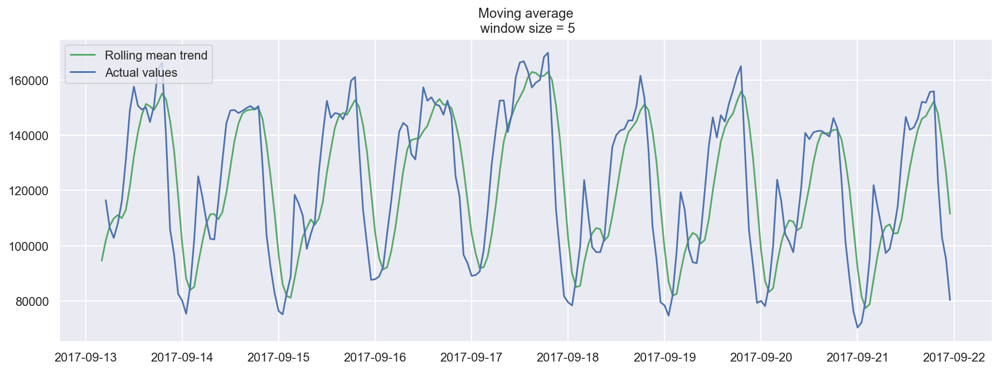

In [9]:
plotMovingAverage(ads, 5) #notice you can tune n to adjust the fit

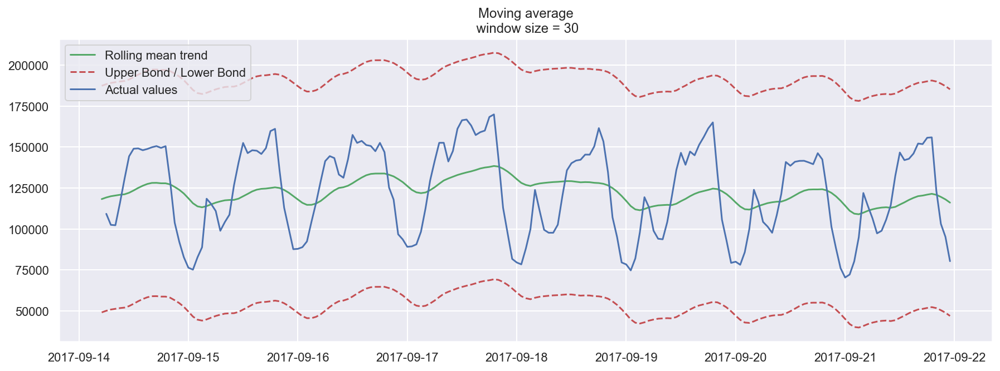

In [10]:
plotMovingAverage(ads, 30, plot_intervals=True)

In [11]:
ads_anomaly = ads.copy()
ads_anomaly.iloc[-20] = ads_anomaly.iloc[-20] * 0.2  # say we have 80% drop of ads
#intentionally making a value an anomaly

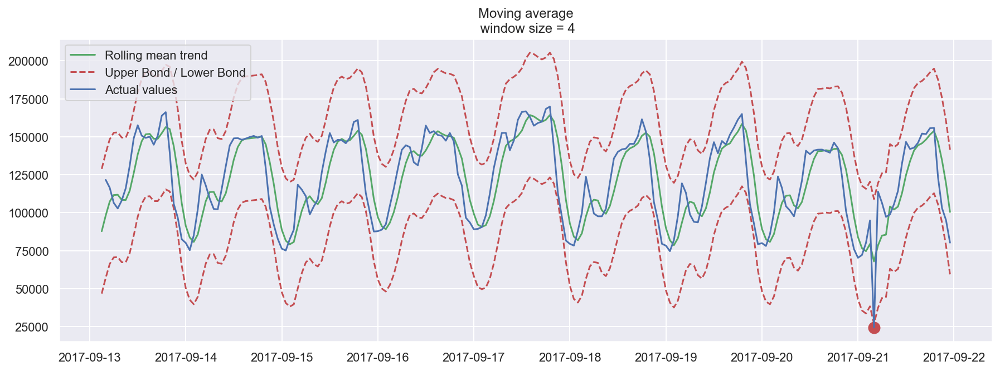

In [12]:
plotMovingAverage(ads_anomaly, 4, plot_intervals=True, plot_anomalies=True)

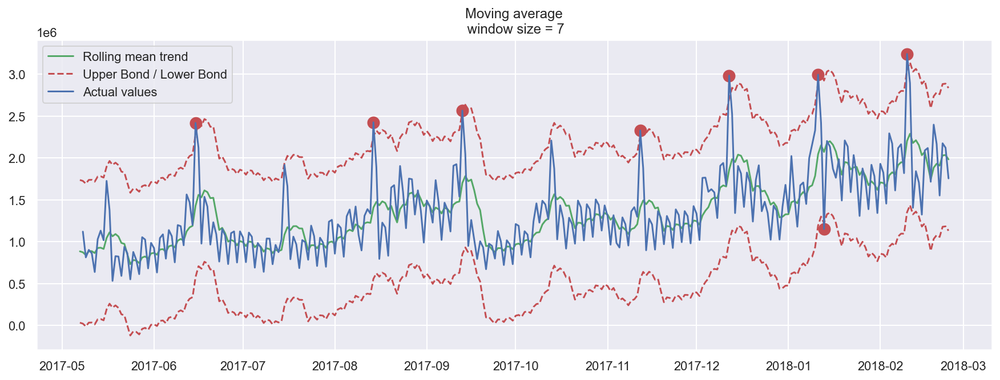

In [13]:
plotMovingAverage(
    currency, 7, plot_intervals=True, plot_anomalies=True
)  # weekly smoothing

Problem with moving average is that it creates many false positives, best to consider more complex models

Weighted average is a simple modification to the moving average. The weights sum up to 1 with larger weights assigned to more recent observations.

$$\hat{y_t} = \sum_{n-1}^k \omega_n y_{t+1-n}$$

In [14]:
def weighted_average(series, weights):
    """
        Calculate weighted average on the series.
        Assuming weights are sorted in descending order
        (larger weights are assigned to more recent observations).
    """
    result = 0.0
    for n in range(len(weights)):
        result += series.iloc[-n - 1] * weights[n]
    return float(result)

In [15]:
weighted_average(ads, [0.6, 0.3, 0.1])

87025.5

In [16]:
# just checking
0.6 * ads.iloc[-1] + 0.3 * ads.iloc[-2] + 0.1 * ads.iloc[-3]

Ads    87025.5
dtype: float64

Instead of weighting last k values of time series, weight all available observations while exponentially decreaseing the weights as we move further back in time
- Exponential Smoothing: $$ \hat{y_t} = \alpha * y_t + (1 - \alpha) * \hat{y_{t-1}} $$

Alpha is a smoothing factor that defines how quickly we will forget the last available true observation (smaller alpha is, the more influence the previous observations have and the smoother the series is)


In [17]:
def exponential_smoothing(series, alpha):
    """
        series - dataset with timestamps
        alpha - float [0.0, 1.0], smoothing parameter
    """
    result = [series[0]]  # first value is same as series
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n - 1])
    return result

In [18]:
def plotExponentialSmoothing(series, alphas):
    """
        Plots exponential smoothing with different alphas

        series - dataset with timestamps
        alphas - list of floats, smoothing parameters

    """
    with plt.style.context("seaborn-white"):
        plt.figure(figsize=(15, 7))
        for alpha in alphas:
            plt.plot(
                exponential_smoothing(series, alpha), label="Alpha {}".format(alpha)
            )
        plt.plot(series.values, "c", label="Actual")
        plt.legend(loc="best")
        plt.axis("tight")
        plt.title("Exponential Smoothing")
        plt.grid(True);

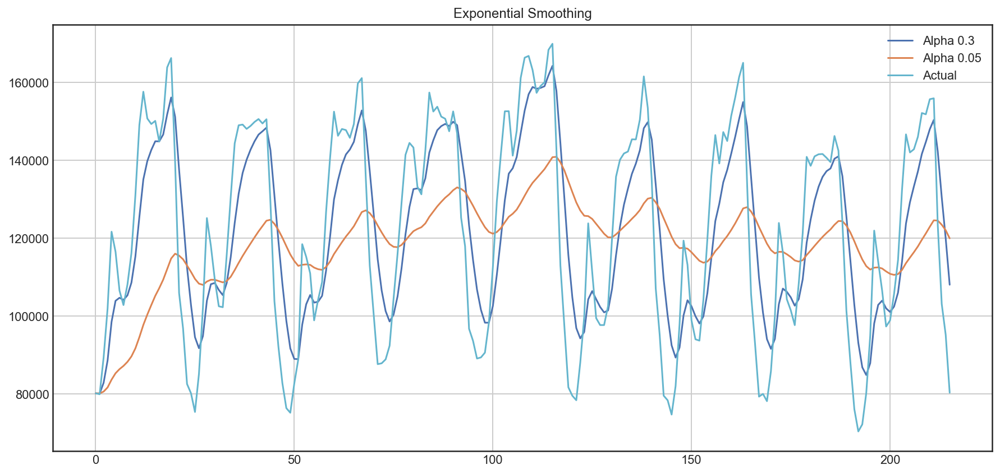

In [19]:
plotExponentialSmoothing(ads.Ads, [0.3, 0.05])

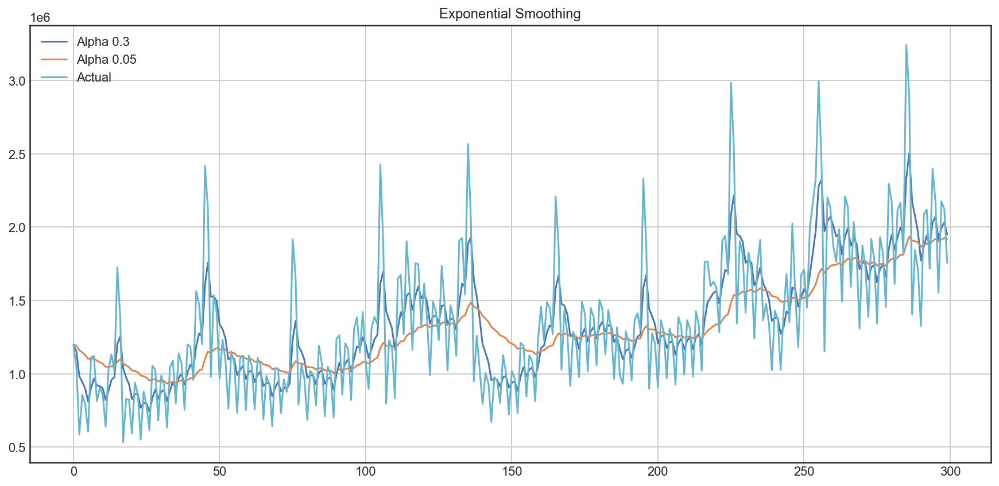

In [20]:
plotExponentialSmoothing(currency.GEMS_GEMS_SPENT, [0.3, 0.05])

Double exponential smoothing
- Previous methods are for single future point prediction
- Utilize series decomposition two obtain intercept and slope


In [21]:
def double_exponential_smoothing(series, alpha, beta):
    """
        series - dataset with timeseries
        alpha - float [0.0, 1.0], smoothing parameter for level
        beta - float [0.0, 1.0], smoothing parameter for trend
    """
    # first value is same as series
    result = [series[0]]
    for n in range(1, len(series) + 1):
        if n == 1:
            level, trend = series[0], series[1] - series[0]
        if n >= len(series):  # forecasting
            value = result[-1]
        else:
            value = series[n]
        last_level, level = level, alpha * value + (1 - alpha) * (level + trend)
        trend = beta * (level - last_level) + (1 - beta) * trend
        result.append(level + trend)
    return result


def plotDoubleExponentialSmoothing(series, alphas, betas):
    """
        Plots double exponential smoothing with different alphas and betas

        series - dataset with timestamps
        alphas - list of floats, smoothing parameters for level
        betas - list of floats, smoothing parameters for trend
    """

    with plt.style.context("seaborn-white"):
        plt.figure(figsize=(20, 8))
        for alpha in alphas:
            for beta in betas:
                plt.plot(
                    double_exponential_smoothing(series, alpha, beta),
                    label="Alpha {}, beta {}".format(alpha, beta),
                )
        plt.plot(series.values, label="Actual")
        plt.legend(loc="best")
        plt.axis("tight")
        plt.title("Double Exponential Smoothing")
        plt.grid(True)

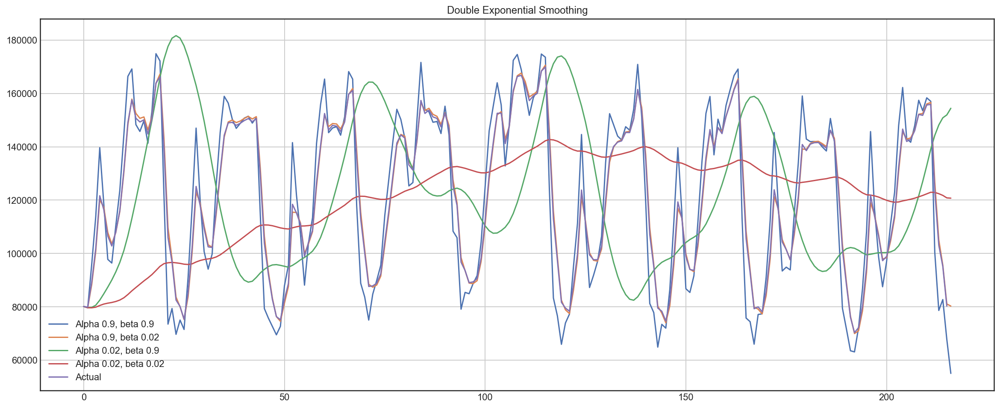

In [22]:
plotDoubleExponentialSmoothing(ads.Ads, alphas=[0.9, 0.02], betas=[0.9, 0.02])

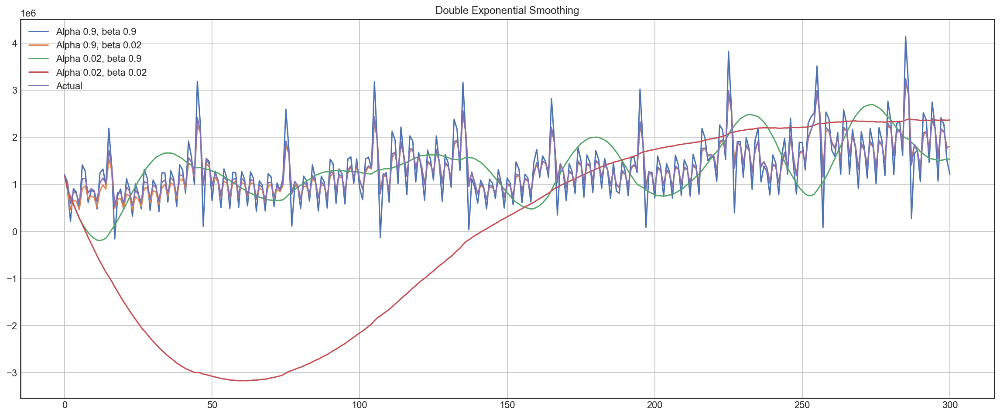

In [23]:
plotDoubleExponentialSmoothing(
    currency.GEMS_GEMS_SPENT, alphas=[0.9, 0.02], betas=[0.9, 0.02]
)

Tunable parameters $$ \alpha and \beta $$, former is responsible for series smoothing around trend, latter for smoothing of trend itself
- Larger the values, the more weight the most recent observations will have and the less smoothed the model series will be

Holt-Winters/Triple Exponential Smoothing
- Adding a third component (seasonality)
- Do not use method if time series not expected to have seasonality
- Seasonal components explain repeated variations around intercept and trend
- Number of seasonal components varies (7 for weekly, 31 for monthly, etc.)


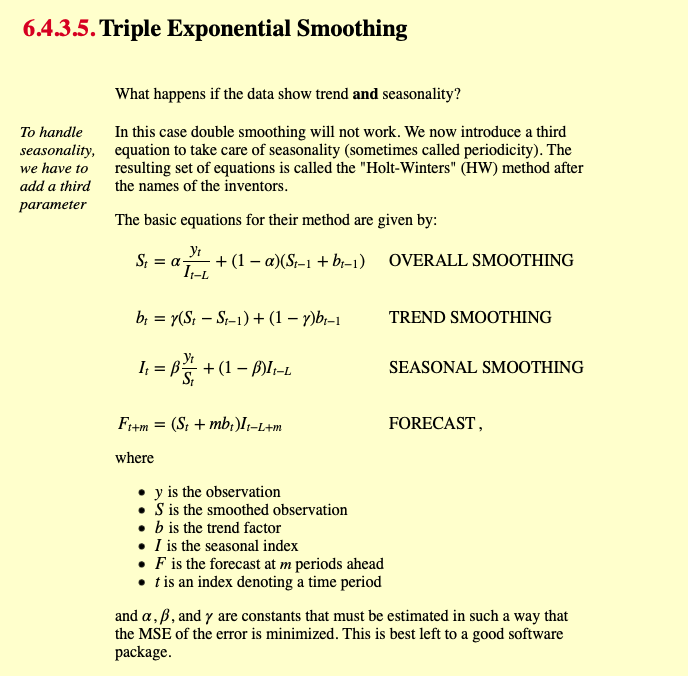

In [24]:
class HoltWinters:

    """
    Holt-Winters model with the anomalies detection using Brutlag method

    # series - initial time series
    # slen - length of a season
    # alpha, beta, gamma - Holt-Winters model coefficients
    # n_preds - predictions horizon
    # scaling_factor - sets the width of the confidence interval by Brutlag (usually takes values from 2 to 3)

    """

    def __init__(self, series, slen, alpha, beta, gamma, n_preds, scaling_factor=1.96):
        self.series = series
        self.slen = slen
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.n_preds = n_preds
        self.scaling_factor = scaling_factor

    def initial_trend(self):
        sum = 0.0
        for i in range(self.slen):
            sum += float(self.series[i + self.slen] - self.series[i]) / self.slen
        return sum / self.slen

    def initial_seasonal_components(self):
        seasonals = {}
        season_averages = []
        n_seasons = int(len(self.series) / self.slen)
        # let's calculate season averages
        for j in range(n_seasons):
            season_averages.append(
                sum(self.series[self.slen * j : self.slen * j + self.slen])
                / float(self.slen)
            )
        # let's calculate initial values
        for i in range(self.slen):
            sum_of_vals_over_avg = 0.0
            for j in range(n_seasons):
                sum_of_vals_over_avg += (
                    self.series[self.slen * j + i] - season_averages[j]
                )
            seasonals[i] = sum_of_vals_over_avg / n_seasons
        return seasonals

    def triple_exponential_smoothing(self):
        self.result = []
        self.Smooth = []
        self.Season = []
        self.Trend = []
        self.PredictedDeviation = []
        self.UpperBond = []
        self.LowerBond = []

        seasonals = self.initial_seasonal_components()

        for i in range(len(self.series) + self.n_preds):
            if i == 0:  # components initialization
                smooth = self.series[0]
                trend = self.initial_trend()
                self.result.append(self.series[0])
                self.Smooth.append(smooth)
                self.Trend.append(trend)
                self.Season.append(seasonals[i % self.slen])

                self.PredictedDeviation.append(0)

                self.UpperBond.append(
                    self.result[0] + self.scaling_factor * self.PredictedDeviation[0]
                )

                self.LowerBond.append(
                    self.result[0] - self.scaling_factor * self.PredictedDeviation[0]
                )
                continue

            if i >= len(self.series):  # predicting
                m = i - len(self.series) + 1
                self.result.append((smooth + m * trend) + seasonals[i % self.slen])

                # when predicting we increase uncertainty on each step
                self.PredictedDeviation.append(self.PredictedDeviation[-1] * 1.01)

            else:
                val = self.series[i]
                last_smooth, smooth = (
                    smooth,
                    self.alpha * (val - seasonals[i % self.slen])
                    + (1 - self.alpha) * (smooth + trend),
                )
                trend = self.beta * (smooth - last_smooth) + (1 - self.beta) * trend
                seasonals[i % self.slen] = (
                    self.gamma * (val - smooth)
                    + (1 - self.gamma) * seasonals[i % self.slen]
                )
                self.result.append(smooth + trend + seasonals[i % self.slen])

                # Deviation is calculated according to Brutlag algorithm.
                self.PredictedDeviation.append(
                    self.gamma * np.abs(self.series[i] - self.result[i])
                    + (1 - self.gamma) * self.PredictedDeviation[-1]
                )

            self.UpperBond.append(
                self.result[-1] + self.scaling_factor * self.PredictedDeviation[-1]
            )

            self.LowerBond.append(
                self.result[-1] - self.scaling_factor * self.PredictedDeviation[-1]
            )

            self.Smooth.append(smooth)
            self.Trend.append(trend)
            self.Season.append(seasonals[i % self.slen])

Time Series cross validation
- Choose a loss function suitable for the task that will tell us how closely model approximates data
- using cross validaiton, we will evaluate our chosen loss function for the given model parameters, calculate the gradient, adjust the model parameters, and so on, descending to global minimum
- Slowly expand training dataset as you build predictions for training

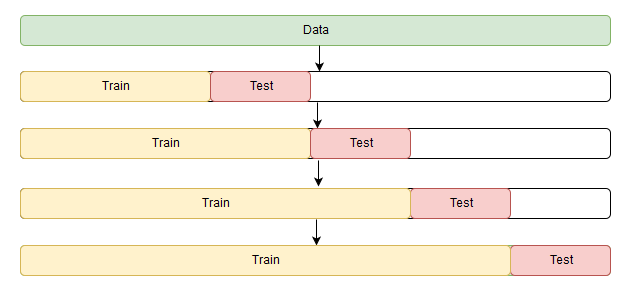

In [25]:
from sklearn.model_selection import \
    TimeSeriesSplit  # you have everything done for you


def timeseriesCVscore(params, series, loss_function=mean_squared_error, slen=24):
    """
        Returns error on CV  

        params - vector of parameters for optimization
        series - dataset with timeseries
        slen - season length for Holt-Winters model
    """
    # errors array
    errors = []

    values = series.values
    alpha, beta, gamma = params

    # set the number of folds for cross-validation
    tscv = TimeSeriesSplit(n_splits=3)

    # iterating over folds, train model on each, forecast and calculate error
    for train, test in tscv.split(values):

        model = HoltWinters(
            series=values[train],
            slen=slen,
            alpha=alpha,
            beta=beta,
            gamma=gamma,
            n_preds=len(test),
        )
        model.triple_exponential_smoothing()

        predictions = model.result[-len(test) :]
        actual = values[test]
        error = loss_function(predictions, actual)
        errors.append(error)

    return np.mean(np.array(errors))

In [26]:
%%time
data = ads.Ads[:-20]  # leave some data for testing

# initializing model parameters alpha, beta and gamma
x = [0, 0, 0]

# Minimizing the loss function
opt = minimize(
    timeseriesCVscore,
    x0=x,
    args=(data, mean_squared_log_error),
    method="TNC",
    bounds=((0, 1), (0, 1), (0, 1)),
)

# Take optimal values...
alpha_final, beta_final, gamma_final = opt.x
print(alpha_final, beta_final, gamma_final)

# ...and train the model with them, forecasting for the next 50 hours
model = HoltWinters(
    data,
    slen=24,
    alpha=alpha_final,
    beta=beta_final,
    gamma=gamma_final,
    n_preds=50,
    scaling_factor=3,
)
model.triple_exponential_smoothing()

0.11676236693712227 0.0026881337430822994 0.055312622299154346
CPU times: user 985 ms, sys: 8.89 ms, total: 994 ms
Wall time: 994 ms


In [27]:
def plotHoltWinters(series, plot_intervals=False, plot_anomalies=False):
    """
        series - dataset with timeseries
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies
    """

    plt.figure(figsize=(20, 10))
    plt.plot(model.result, label="Model")
    plt.plot(series.values, label="Actual")
    error = mean_absolute_percentage_error(series.values, model.result[: len(series)])
    plt.title("Mean Absolute Percentage Error: {0:.2f}%".format(error))

    if plot_anomalies:
        anomalies = np.array([np.NaN] * len(series))
        anomalies[series.values < model.LowerBond[: len(series)]] = series.values[
            series.values < model.LowerBond[: len(series)]
        ]
        anomalies[series.values > model.UpperBond[: len(series)]] = series.values[
            series.values > model.UpperBond[: len(series)]
        ]
        plt.plot(anomalies, "o", markersize=10, label="Anomalies")

    if plot_intervals:
        plt.plot(model.UpperBond, "r--", alpha=0.5, label="Up/Low confidence")
        plt.plot(model.LowerBond, "r--", alpha=0.5)
        plt.fill_between(
            x=range(0, len(model.result)),
            y1=model.UpperBond,
            y2=model.LowerBond,
            alpha=0.2,
            color="grey",
        )

    plt.vlines(
        len(series),
        ymin=min(model.LowerBond),
        ymax=max(model.UpperBond),
        linestyles="dashed",
    )
    plt.axvspan(len(series) - 20, len(model.result), alpha=0.3, color="lightgrey")
    plt.grid(True)
    plt.axis("tight")
    plt.legend(loc="best", fontsize=13);

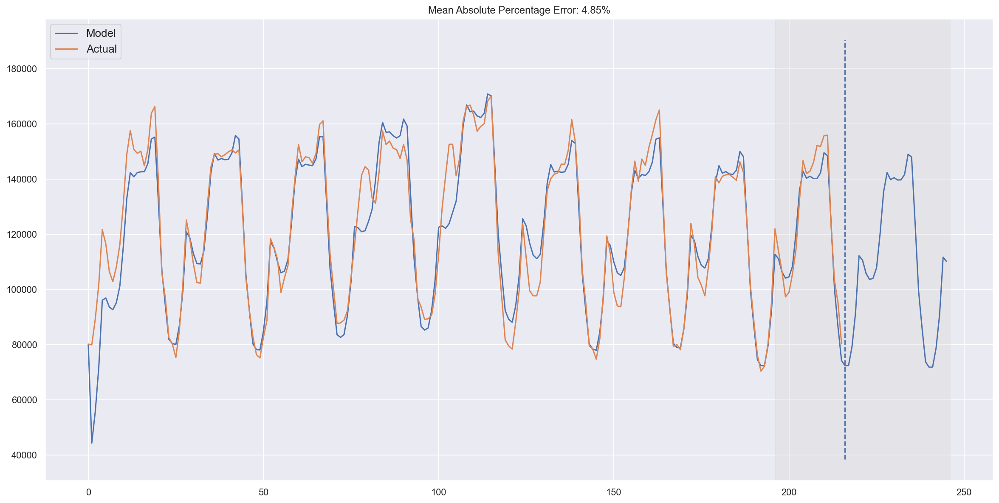

In [28]:
plotHoltWinters(ads.Ads)

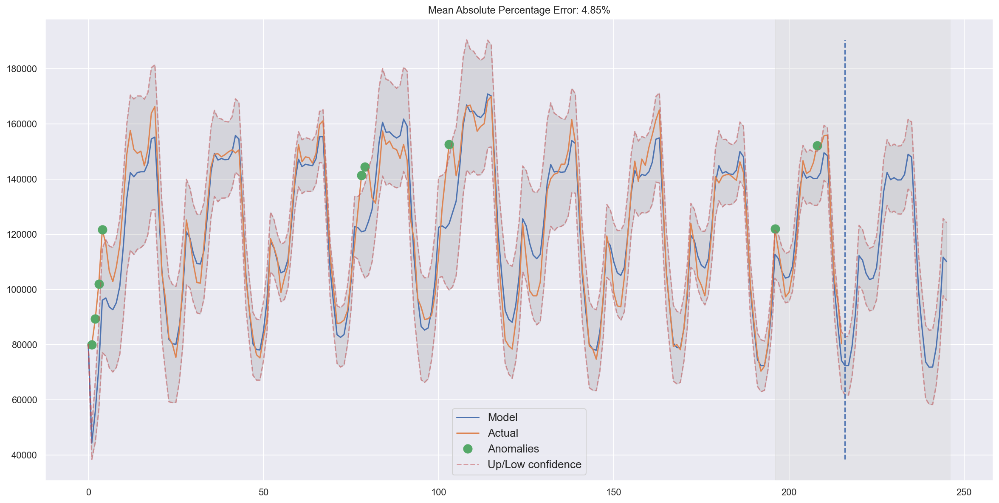

In [29]:
plotHoltWinters(ads.Ads, plot_intervals=True, plot_anomalies=True)

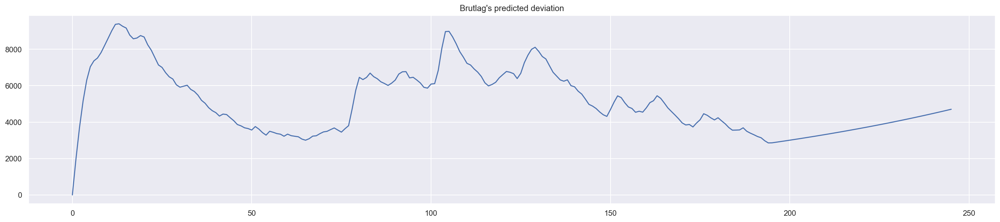

In [30]:
plt.figure(figsize=(25, 5))
plt.plot(model.PredictedDeviation)
plt.grid(True)
plt.axis("tight")
plt.title("Brutlag's predicted deviation");

In [31]:
%%time
data = currency.GEMS_GEMS_SPENT[:-50]
slen = 30  # 30-day seasonality

x = [0, 0, 0]

opt = minimize(
    timeseriesCVscore,
    x0=x,
    args=(data, mean_absolute_percentage_error, slen),
    method="TNC",
    bounds=((0, 1), (0, 1), (0, 1)),
)

alpha_final, beta_final, gamma_final = opt.x
print(alpha_final, beta_final, gamma_final)

model = HoltWinters(
    data,
    slen=slen,
    alpha=alpha_final,
    beta=beta_final,
    gamma=gamma_final,
    n_preds=100,
    scaling_factor=3,
)
model.triple_exponential_smoothing()

0.013190344846993662 0.047616267647338284 0.0
CPU times: user 1.8 s, sys: 79 ms, total: 1.88 s
Wall time: 1.72 s


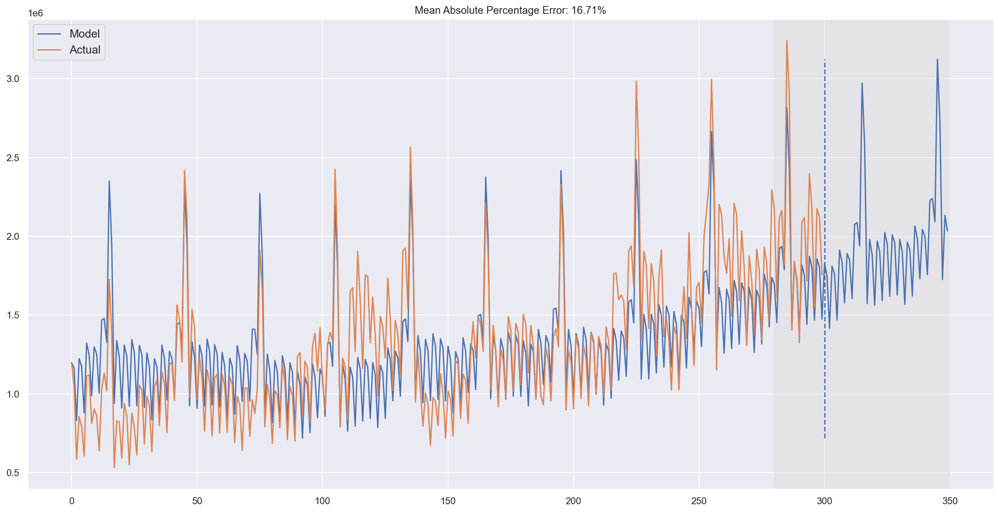

In [32]:
plotHoltWinters(currency.GEMS_GEMS_SPENT)

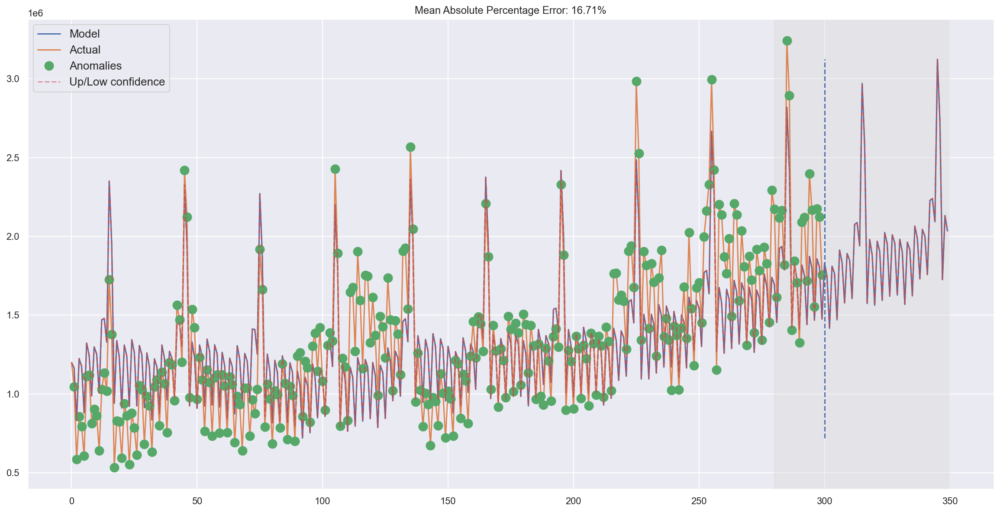

In [33]:
plotHoltWinters(currency.GEMS_GEMS_SPENT, plot_intervals=True, plot_anomalies=True)

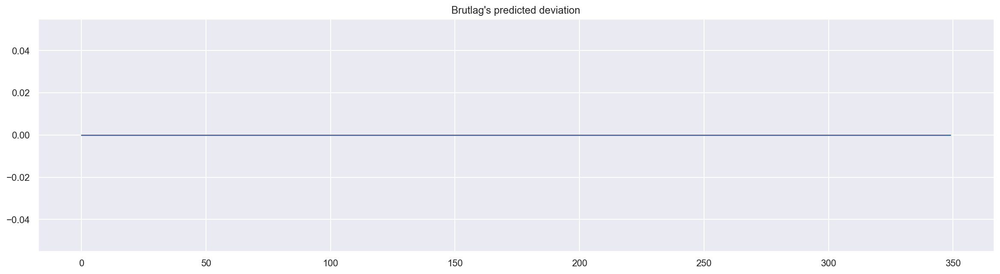

In [34]:
plt.figure(figsize=(20, 5))
plt.plot(model.PredictedDeviation)
plt.grid(True)
plt.axis("tight")
plt.title("Brutlag's predicted deviation");

Econometric approach

Stationarity
- important property of time series
- Properties such as mean and variance don't change over time (homoscedasticity)
- Easy to make predictions on a stationary series (we can assume future statistical properties to be the same as currently observed)


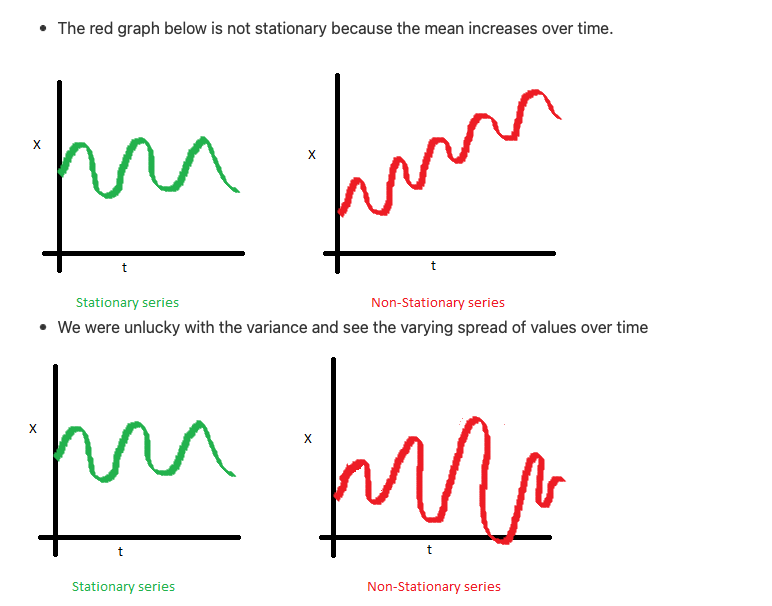

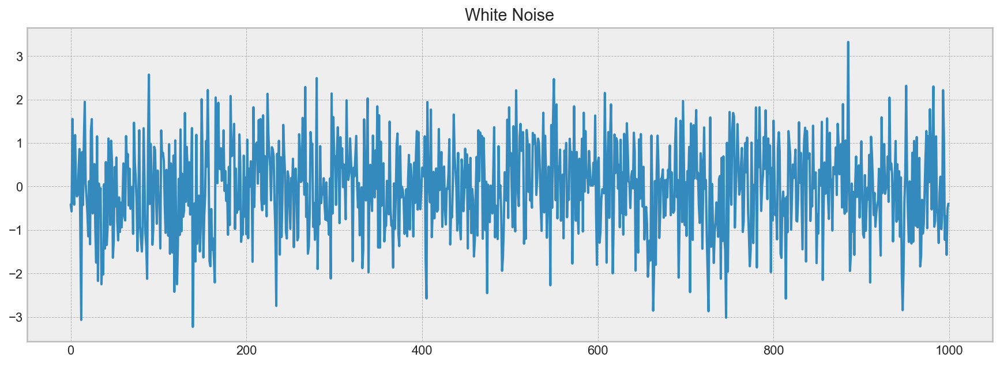

In [35]:
white_noise = np.random.normal(size=1000)
with plt.style.context("bmh"):
    plt.figure(figsize=(15, 5))
    plt.plot(white_noise)
    plt.title("White Noise")

Process generated by standard normal distribution is stationary, oscillates around 0 with deviation of 1
- $$x_t = \rho x_{t-1} + e_t $$
- generating new predictions where each subsequent valud depends on the previous one

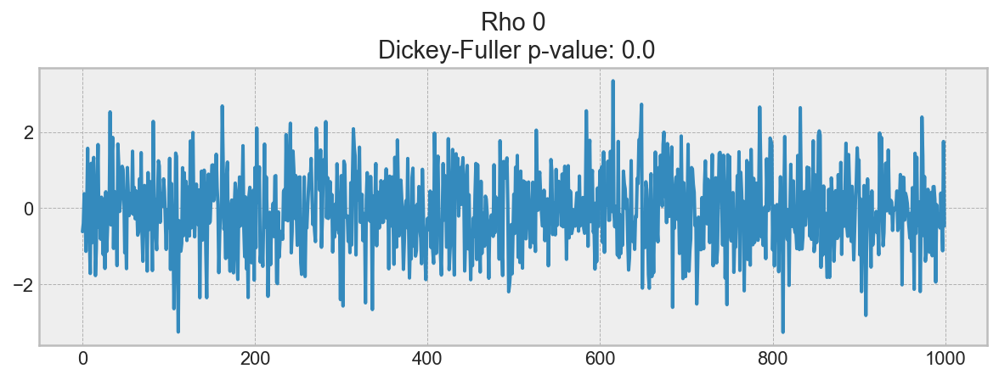

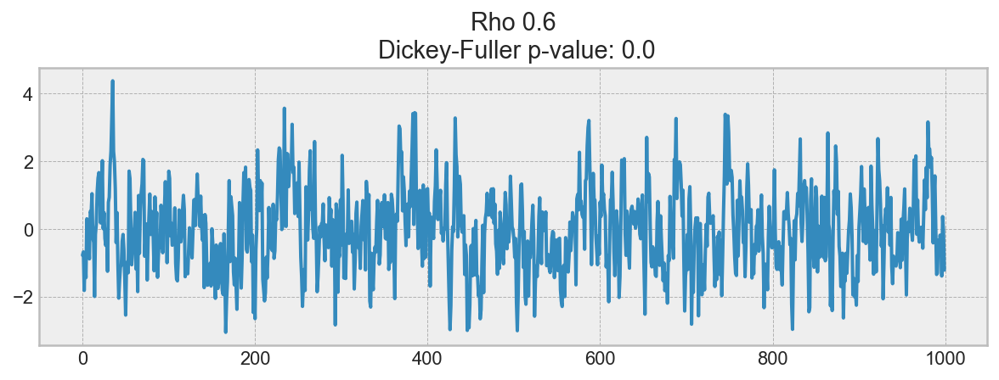

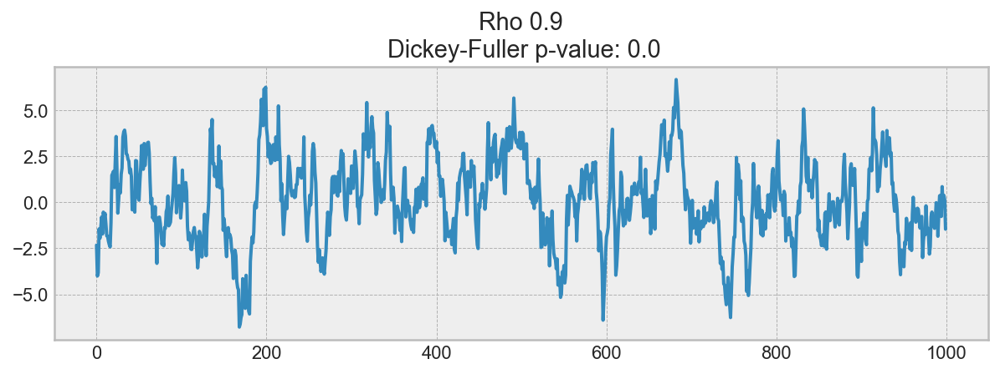

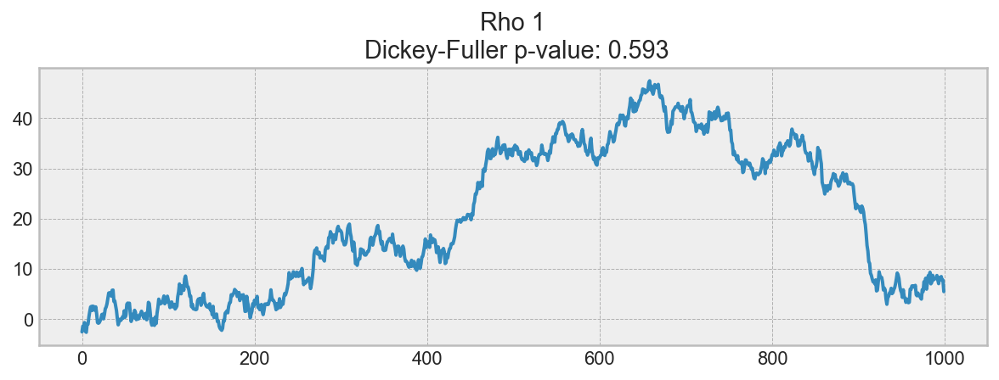

In [36]:
def plotProcess(n_samples=1000, rho=0):
    x = w = np.random.normal(size=n_samples)
    for t in range(n_samples):
        x[t] = rho * x[t - 1] + w[t]

    with plt.style.context("bmh"):
        plt.figure(figsize=(10, 3))
        plt.plot(x)
        plt.title(
            "Rho {}\n Dickey-Fuller p-value: {}".format(
                rho, round(sm.tsa.stattools.adfuller(x)[1], 3)
            )
        )


for rho in [0, 0.6, 0.9, 1]:
    plotProcess(rho=rho)

As rho is tuned, we get a more random/non stationary time-series if rho is closer to 1

Dickey-Fuller test measures the stationarity of time series

In [37]:
def tsplot(y, lags=None, figsize=(12, 7), style="bmh"):
    """
        Plot time series, its ACF and PACF, calculate Dickey–Fuller test

        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)

    with plt.style.context(style):
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))

        ts_ax.plot(y)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title(
            "Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}".format(p_value)
        )
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

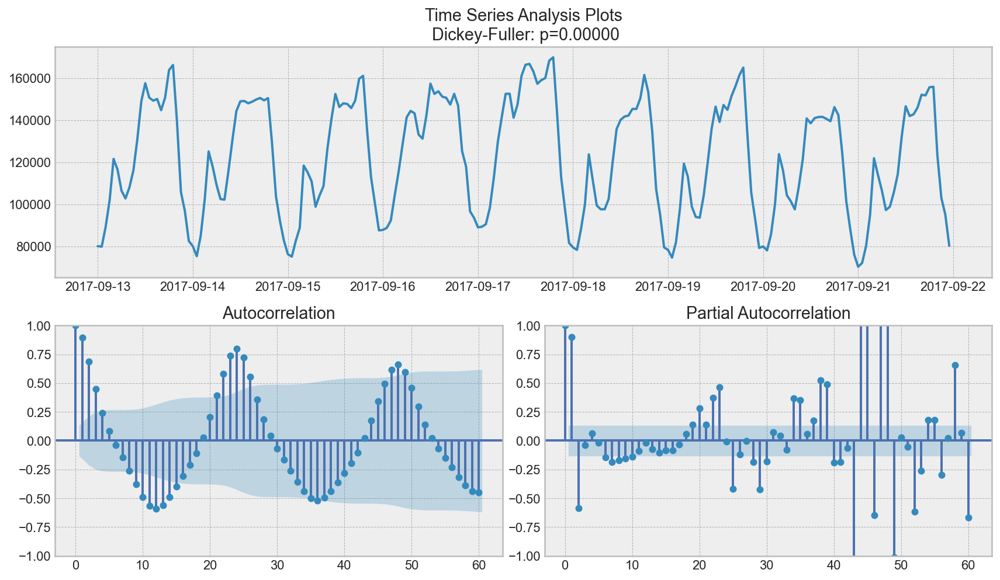

In [38]:
tsplot(ads.Ads, lags=60)

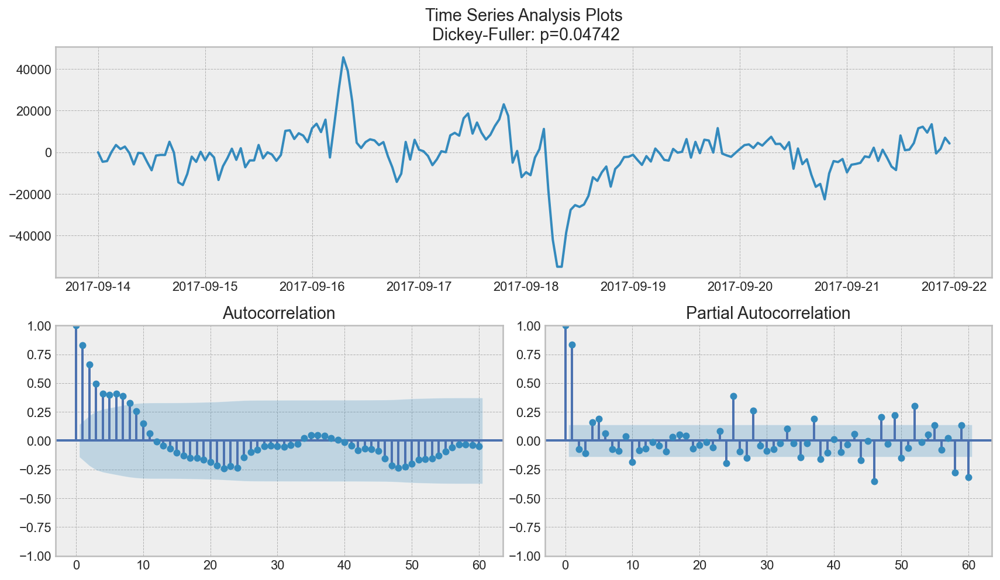

In [39]:
ads_diff = ads.Ads - ads.Ads.shift(24)
tsplot(ads_diff[24:], lags=60)

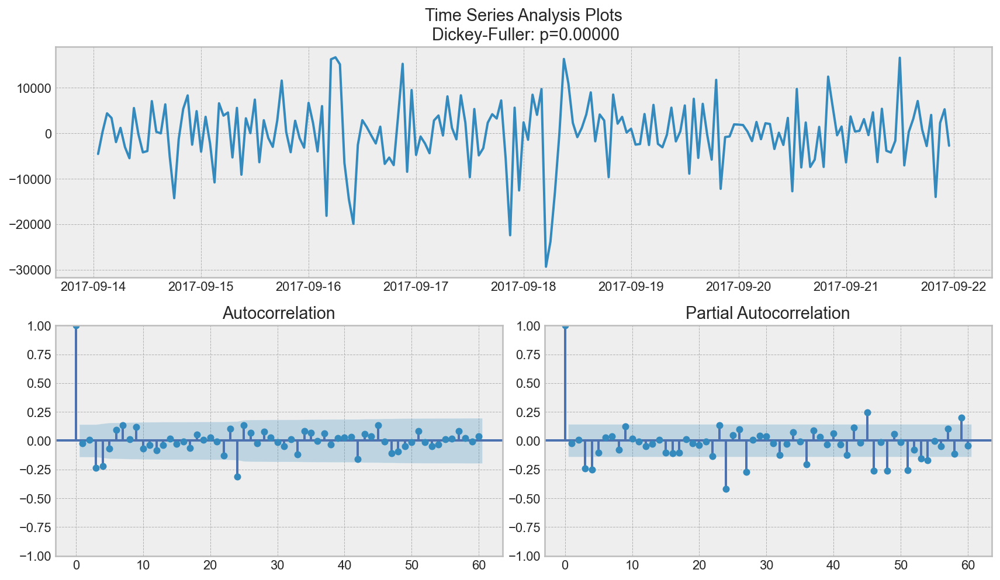

In [40]:
ads_diff = ads_diff - ads_diff.shift(1)
tsplot(ads_diff[24 + 1 :], lags=60)

ARIMA-family Crash Course
- Seasonal Autoregression Moving Average Model
- AR(p) ~ autoregression model regression of time series onto itself, maximum lag is referred to as p
- MA(q) ~ moving average model
- $$AR(p) + MA(q) = ARMA(p,q)$$
ARIMA = Autoregressive-moving-average model
- I(d) = order of integration (number of nonseasonal differences needed to make series stationary)
- S(s) = seasonality, equal to season period length of series
    - (P,D,Q)
    - P: order of autoregression for the seasonal component of model
    - Q: similar logic using ACF plot
    - D: order of seasonal integration (1 or 0, depending on whether seasonal differences are applied)

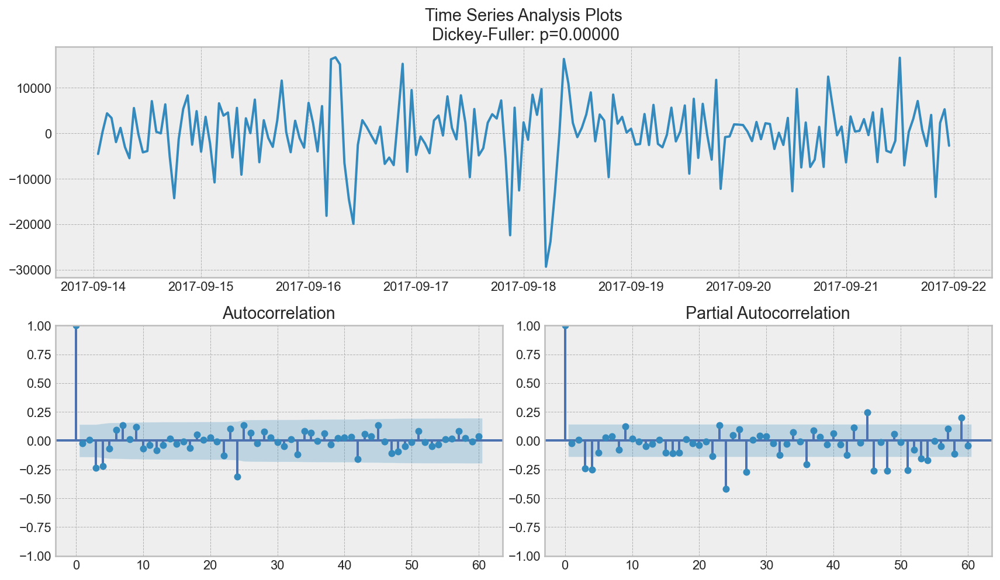

In [41]:
tsplot(ads_diff[24 + 1 :], lags=60)

- p is most probably 4 since it is the last significant lag on the PACF, after which, most others are not significant.
- d equals 1 because we had first differences
- q should be somewhere around 4 as well as seen on the ACF
- P might be 2, since 24-th and 48-th lags are somewhat significant on the PACF
- D again equals 1 because we performed seasonal differentiation
- Q is probably 1. The 24-th lag on ACF is significant while the 48-th is not.

In [42]:
# setting initial values and some bounds for them
ps = range(2, 5)
d = 1
qs = range(2, 5)
Ps = range(0, 2)
D = 1
Qs = range(0, 2)
s = 24  # season length is still 24

# creating list with all the possible combinations of parameters
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

36

In [43]:
def optimizeSARIMA(parameters_list, d, D, s):
    """
        Return dataframe with parameters and corresponding AIC

        parameters_list - list with (p, q, P, Q) tuples
        d - integration order in ARIMA model
        D - seasonal integration order
        s - length of season
    """

    results = []
    best_aic = float("inf")

    for param in tqdm(parameters_list):
        # we need try-except because on some combinations model fails to converge
        try:
            model = sm.tsa.statespace.SARIMAX(
                ads.Ads,
                order=(param[0], d, param[1]),
                seasonal_order=(param[2], D, param[3], s),
            ).fit(disp=-1)
        except:
            continue
        aic = model.aic
        # saving best model, AIC and parameters
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ["parameters", "aic"]
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by="aic", ascending=True).reset_index(
        drop=True
    )

    return result_table

In [44]:
%%time
result_table = optimizeSARIMA(parameters_list, d, D, s)

  0%|          | 0/36 [00:00<?, ?it/s]

CPU times: user 3min 42s, sys: 7min 33s, total: 11min 15s
Wall time: 1min 56s


In [45]:
result_table.head()

,parameters,aic
0,"(2, 3, 1, 1)",3888.642174
1,"(3, 2, 1, 1)",3888.763568
2,"(4, 2, 1, 1)",3890.279740
3,"(3, 3, 1, 1)",3890.513196
4,"(2, 4, 1, 1)",3892.302849


In [46]:
# set the parameters that give the lowest AIC
p, q, P, Q = result_table.parameters[0]

best_model = sm.tsa.statespace.SARIMAX(
    ads.Ads, order=(p, d, q), seasonal_order=(P, D, Q, s)
).fit(disp=-1)
print(best_model.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                  Ads   No. Observations:                  216
Model:             SARIMAX(2, 1, 3)x(1, 1, [1], 24)   Log Likelihood               -1936.321
Date:                              Tue, 25 Oct 2022   AIC                           3888.642
Time:                                      16:57:08   BIC                           3914.660
Sample:                                  09-13-2017   HQIC                          3899.181
                                       - 09-21-2017                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7913      0.270      2.928      0.003       0.262       1.321
ar.L2         -0.55

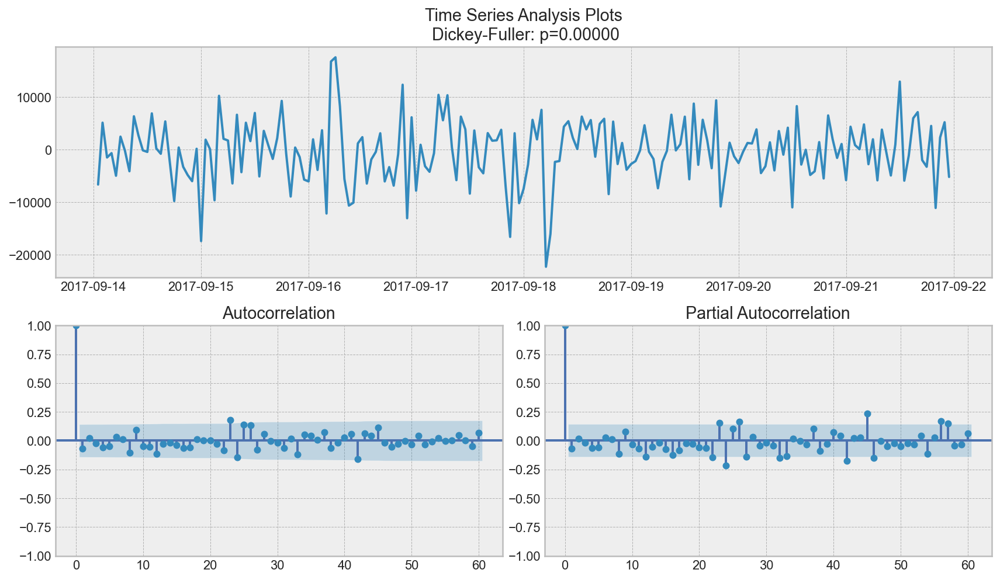

In [47]:
tsplot(best_model.resid[24 + 1 :], lags=60)

In [48]:
def plotSARIMA(series, model, n_steps):
    """
        Plots model vs predicted values

        series - dataset with timeseries
        model - fitted SARIMA model
        n_steps - number of steps to predict in the future

    """
    # adding model values
    data = series.copy()
    data.columns = ["actual"]
    data["arima_model"] = model.fittedvalues
    # making a shift on s+d steps, because these values were unobserved by the model
    # due to the differentiating
    data["arima_model"][: s + d] = np.NaN

    # forecasting on n_steps forward
    forecast = model.predict(start=data.shape[0], end=data.shape[0] + n_steps)
    forecast = data.arima_model.append(forecast)
    # calculate error, again having shifted on s+d steps from the beginning
    error = mean_absolute_percentage_error(
        data["actual"][s + d :], data["arima_model"][s + d :]
    )

    plt.figure(figsize=(15, 7))
    plt.title("Mean Absolute Percentage Error: {0:.2f}%".format(error))
    plt.plot(forecast, color="r", label="model")
    plt.axvspan(data.index[-1], forecast.index[-1], alpha=0.5, color="lightgrey")
    plt.plot(data.actual, label="actual")
    plt.legend()
    plt.grid(True);

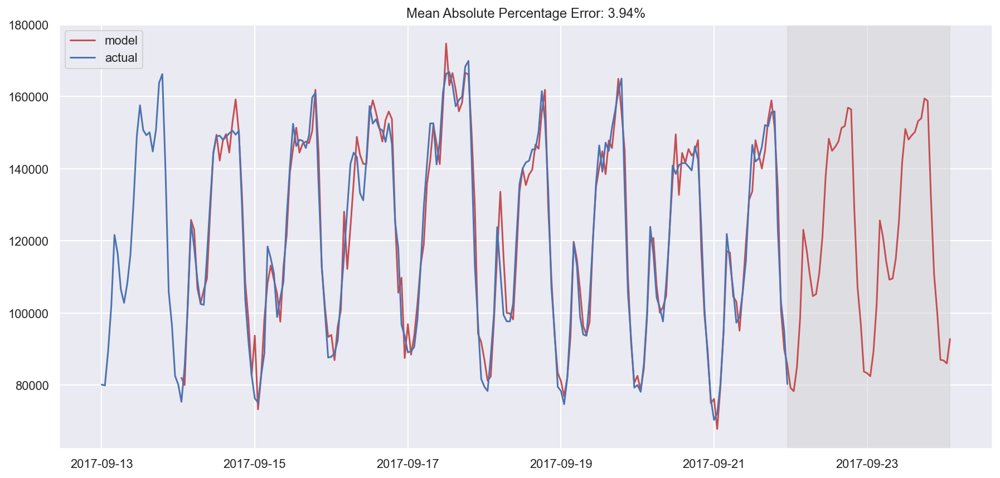

In [49]:
plotSARIMA(ads, best_model, 50)

Linear models for time series
- Sometimes, models such as SARIMA, Holt-Winters require extensive data preparation and are hard to tune
- Better to stick to simple regression models (ridge, random forest, linear)
- SARIMA: autoregressive integrated moving average

Feature extraction
- Time series lags
- Window statistics
    - Max/min value of a series in a window
    - Average/median value in a window
    - Window variance
    - etc.
- Date and time features:
    - minute of an hour, hour of a day, day of the week
    - Special days
- Target encoding
- Forecasts from other models

Time Series Lags
-  Shifting series n steps back allows us to get a feature column where current value of time series is aligned with value at time t - n
- Making a lag shift and training a model on this feature will allow model to forecast 1 step ahead from current state
- Increasing lab to n units will allow model to make predictions n steps ahead by using data observed n steps back


In [50]:
# Creating a copy of the initial datagrame to make various transformations
data = pd.DataFrame(ads.Ads.copy())
data.columns = ["y"]

In [51]:
# Adding the lag of the target variable from 6 steps back up to 24
for i in range(6, 25):
    data["lag_{}".format(i)] = data.y.shift(i)

In [52]:
# take a look at the new dataframe
data.tail(7)

,y,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,lag_13,lag_14,lag_15,lag_16,lag_17,lag_18,lag_19,lag_20,lag_21,lag_22,lag_23,lag_24
Time,,,,,,,,,,,,,,,,,,,,
2017-09-21 17:00:00,151790,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0,123945.0,142425.0,146215.0,139515.0
2017-09-21 18:00:00,155665,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0,123945.0,142425.0,146215.0
2017-09-21 19:00:00,155890,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0,123945.0,142425.0
2017-09-21 20:00:00,123395,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0,123945.0
2017-09-21 21:00:00,103080,146020.0,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0
2017-09-21 22:00:00,95155,152120.0,146020.0,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0
2017-09-21 23:00:00,80285,151790.0,152120.0,146020.0,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0


In [53]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

# for time-series cross-validation set 5 folds
tscv = TimeSeriesSplit(n_splits=5)

In [54]:
def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """

    # get the index after which test set starts
    test_index = int(len(X) * (1 - test_size))

    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]

    return X_train, X_test, y_train, y_test

In [55]:
y = data.dropna().y
X = data.dropna().drop(["y"], axis=1)

# reserve 30% of data for testing
X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

In [56]:
# machine learning in two lines
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [57]:
def plotModelResults(
    model, X_train=X_train, X_test=X_test, plot_intervals=False, plot_anomalies=False
):
    """
        Plots modelled vs fact values, prediction intervals and anomalies

    """

    prediction = model.predict(X_test)

    plt.figure(figsize=(15, 7))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.plot(y_test.values, label="actual", linewidth=2.0)

    if plot_intervals:
        cv = cross_val_score(
            model, X_train, y_train, cv=tscv, scoring="neg_mean_absolute_error"
        )
        mae = cv.mean() * (-1)
        deviation = cv.std()

        scale = 1.96
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)

        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)

        if plot_anomalies:
            anomalies = np.array([np.NaN] * len(y_test))
            anomalies[y_test < lower] = y_test[y_test < lower]
            anomalies[y_test > upper] = y_test[y_test > upper]
            plt.plot(anomalies, "o", markersize=10, label="Anomalies")

    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True)


def plotCoefficients(model):
    """
        Plots sorted coefficient values of the model
    """

    coefs = pd.DataFrame(model.coef_, X_train.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)

    plt.figure(figsize=(15, 7))
    coefs.coef.plot(kind="bar")
    plt.grid(True, axis="y")
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles="dashed");

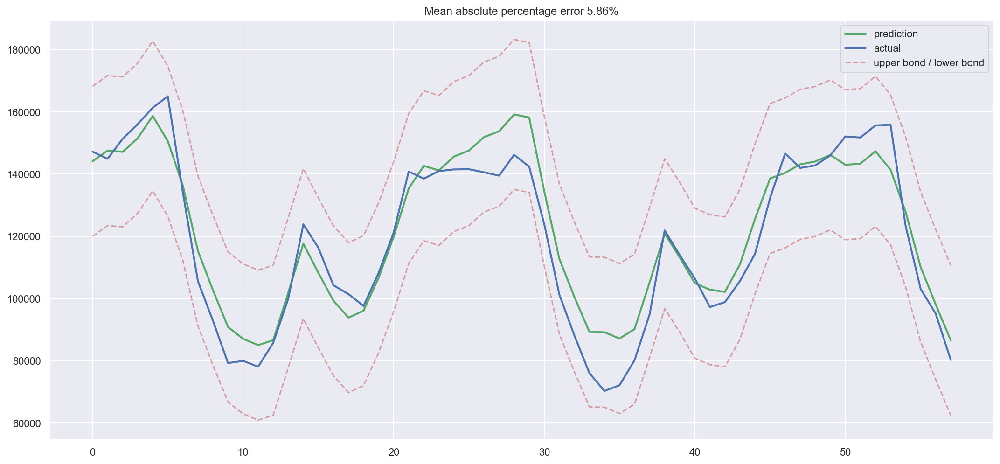

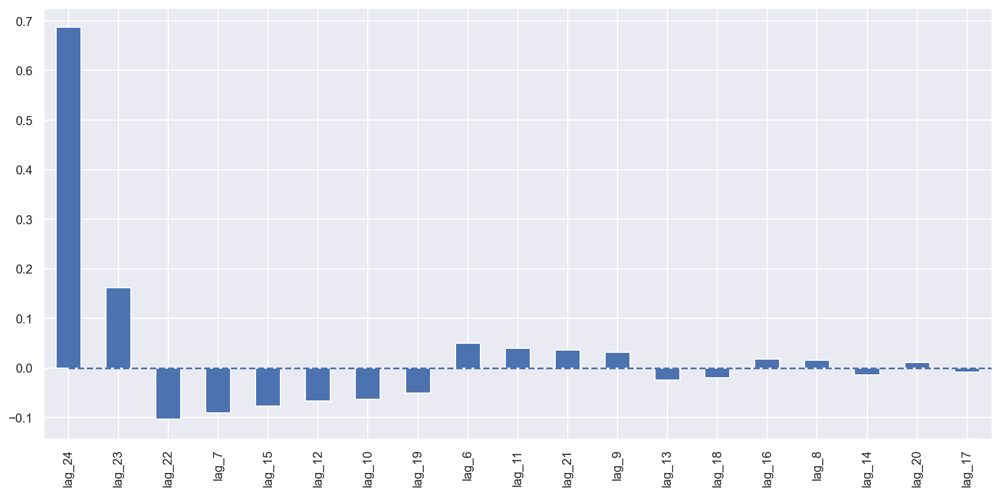

In [58]:
plotModelResults(lr, plot_intervals=True)
plotCoefficients(lr)

In [59]:
#adding hour, day of week, and boolean for weekend
data.index = pd.to_datetime(data.index)
data["hour"] = data.index.hour
data["weekday"] = data.index.weekday
data["is_weekend"] = data.weekday.isin([5, 6]) * 1
data.tail()

,y,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,lag_13,lag_14,...,lag_18,lag_19,lag_20,lag_21,lag_22,lag_23,lag_24,hour,weekday,is_weekend
Time,,,,,,,,,,,,,,,,,,,,,
2017-09-21 19:00:00,155890,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,113950.0,...,72150.0,70335.0,76050.0,88170.0,101360.0,123945.0,142425.0,19,3,0
2017-09-21 20:00:00,123395,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,106495.0,...,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0,123945.0,20,3,0
2017-09-21 21:00:00,103080,146020.0,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,97290.0,...,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,101360.0,21,3,0
2017-09-21 22:00:00,95155,152120.0,146020.0,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,98860.0,...,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,88170.0,22,3,0
2017-09-21 23:00:00,80285,151790.0,152120.0,146020.0,142815.0,141995.0,146630.0,132335.0,114380.0,105635.0,...,113950.0,121910.0,94945.0,80195.0,72150.0,70335.0,76050.0,23,3,0


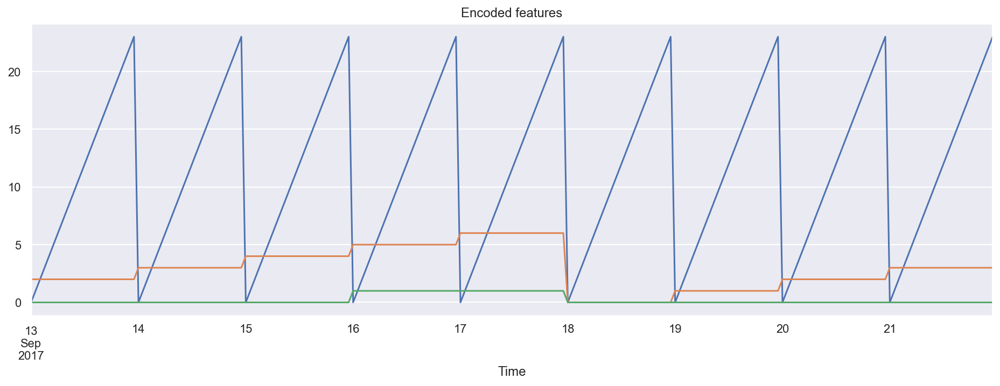

In [60]:
plt.figure(figsize=(16, 5))
plt.title("Encoded features")
data.hour.plot()
data.weekday.plot()
data.is_weekend.plot()
plt.grid(True);

In [61]:
#Scaling lag features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()


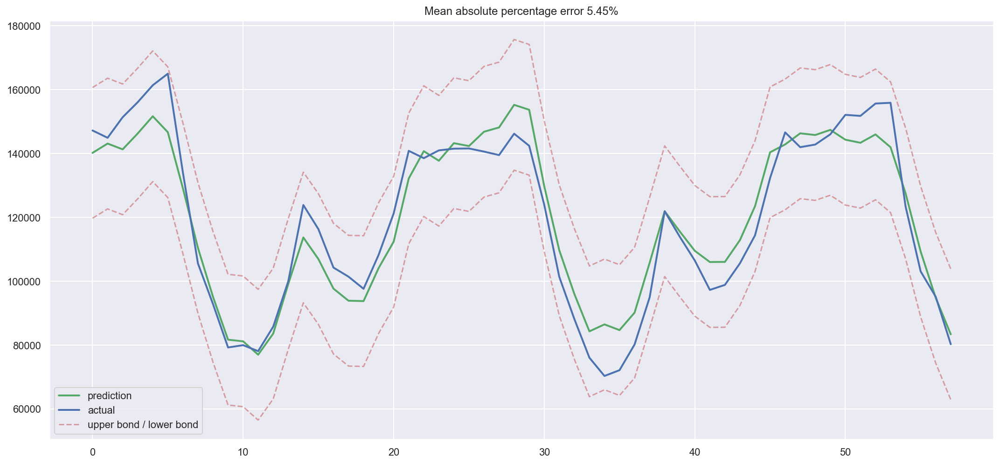

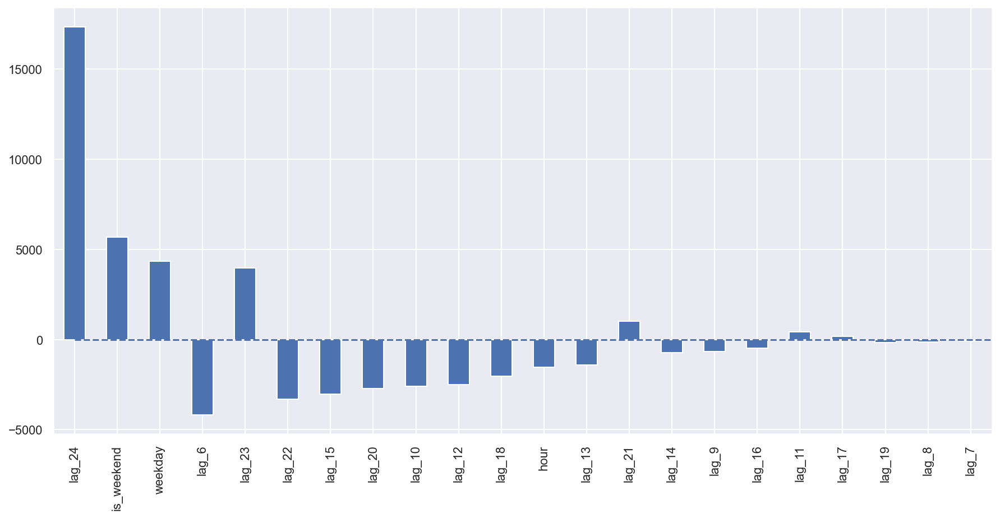

In [62]:
y = data.dropna().y
X = data.dropna().drop(["y"], axis=1)

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(lr, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True)
plotCoefficients(lr)

Target Encoding
- Encoding categorical variables by encoding mean
- Calculate mean over training set


In [63]:
def code_mean(data, cat_feature, real_feature):
    """
    Returns a dictionary where keys are unique categories of the cat_feature,
    and values are means over real_feature
    """
    return dict(data.groupby(cat_feature)[real_feature].mean())

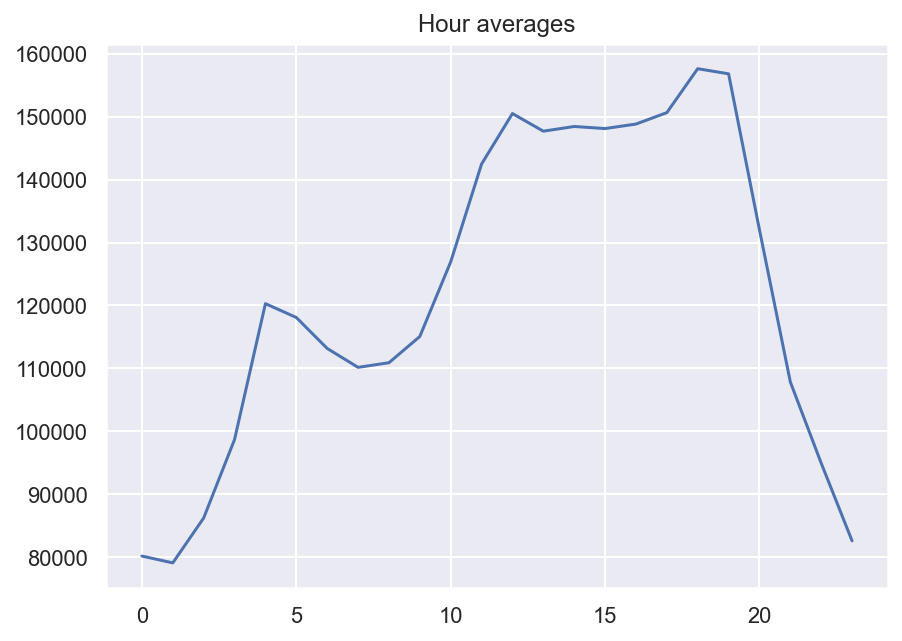

In [64]:
average_hour = code_mean(data, "hour", "y")
plt.figure(figsize=(7, 5))
plt.title("Hour averages")
pd.DataFrame.from_dict(average_hour, orient="index")[0].plot()
plt.grid(True);

In [65]:
def prepareData(series, lag_start, lag_end, test_size, target_encoding=False):
    """
        series: pd.DataFrame
            dataframe with timeseries

        lag_start: int
            initial step back in time to slice target variable
            example - lag_start = 1 means that the model
                      will see yesterday's values to predict today

        lag_end: int
            final step back in time to slice target variable
            example - lag_end = 4 means that the model
                      will see up to 4 days back in time to predict today

        test_size: float
            size of the test dataset after train/test split as percentage of dataset

        target_encoding: boolean
            if True - add target averages to the dataset

    """

    # copy of the initial dataset
    data = pd.DataFrame(series.copy())
    data.columns = ["y"]

    # lags of series
    for i in range(lag_start, lag_end):
        data["lag_{}".format(i)] = data.y.shift(i)

    # datetime features
    data.index = pd.to_datetime(data.index)
    data["hour"] = data.index.hour
    data["weekday"] = data.index.weekday
    data["is_weekend"] = data.weekday.isin([5, 6]) * 1

    if target_encoding:
        # calculate averages on train set only
        test_index = int(len(data.dropna()) * (1 - test_size))
        data["weekday_average"] = list(
            map(code_mean(data[:test_index], "weekday", "y").get, data.weekday)
        )
        data["hour_average"] = list(
            map(code_mean(data[:test_index], "hour", "y").get, data.hour)
        )

        # drop encoded variables
        data.drop(["hour", "weekday"], axis=1, inplace=True)

    # train-test split
    y = data.dropna().y
    X = data.dropna().drop(["y"], axis=1)
    X_train, X_test, y_train, y_test = timeseries_train_test_split(
        X, y, test_size=test_size
    )

    return X_train, X_test, y_train, y_test

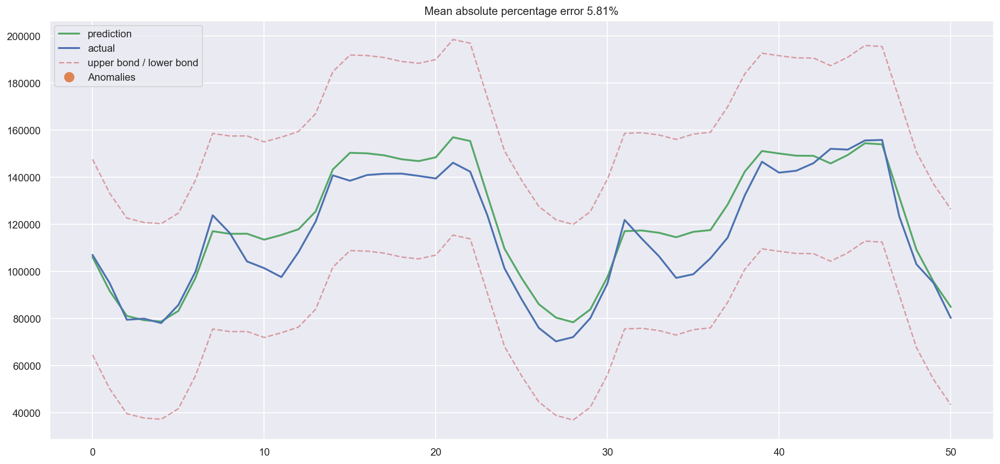

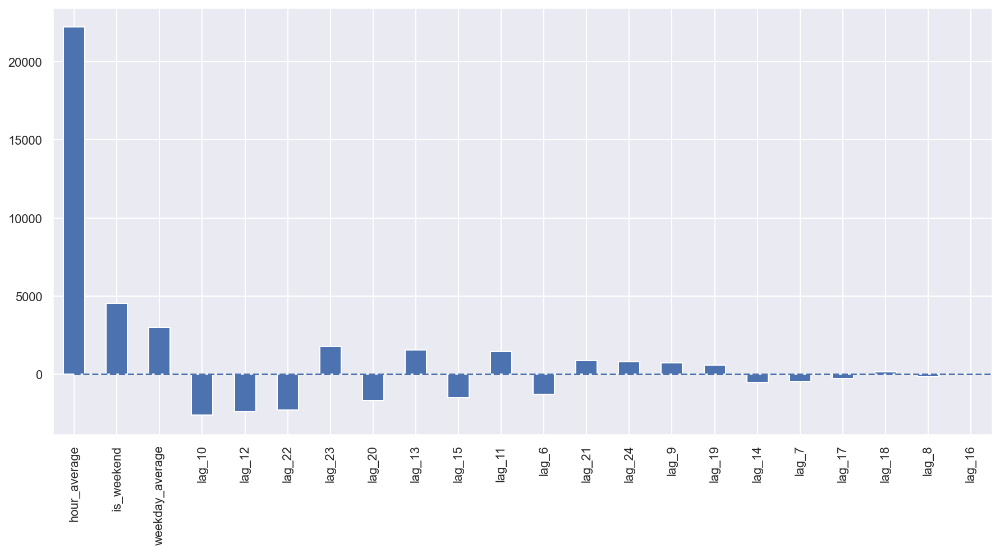

In [66]:
X_train, X_test, y_train, y_test = prepareData(
    ads.Ads, lag_start=6, lag_end=25, test_size=0.3, target_encoding=True
)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(
    lr,
    X_train=X_train_scaled,
    X_test=X_test_scaled,
    plot_intervals=True,
    plot_anomalies=True,
)
plotCoefficients(lr)

Clear example of overfitting, model leans more to one feature (hour_average) than others, so we should apply regularization

Ridge and Lasso Regressions
- regularization models that add r terms to regression models
- constrain the loss function
- Ridge Regression
    - Constraints are sum of squares of coefficients multiplied by regularization coefficient (the larger the ce, the bigger the loss)
    - This L2 regularization results in higher bias and lower variance, so model generalizes better
- Lasso regression
    - adds absolute value of coefficients to loss function
    - during optimization process, coefficients of unimportant features may become zeroes
    - L1 Regularization

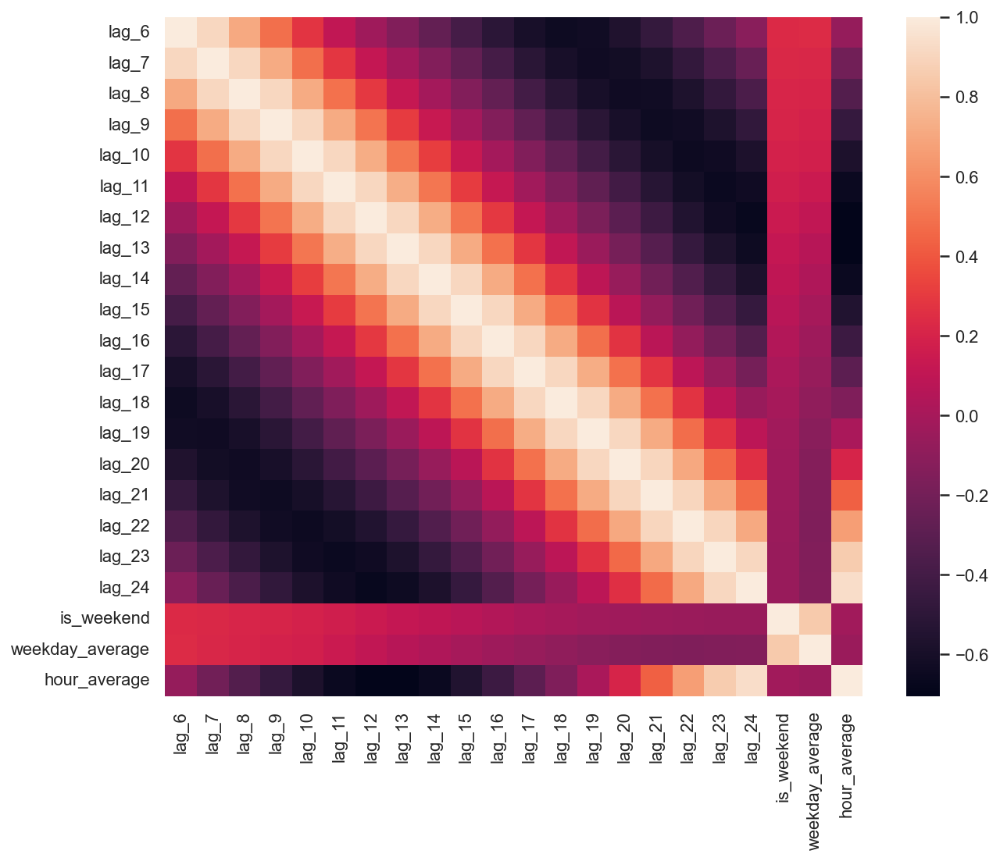

In [67]:
plt.figure(figsize=(10, 8))
sns.heatmap(X_train.corr());

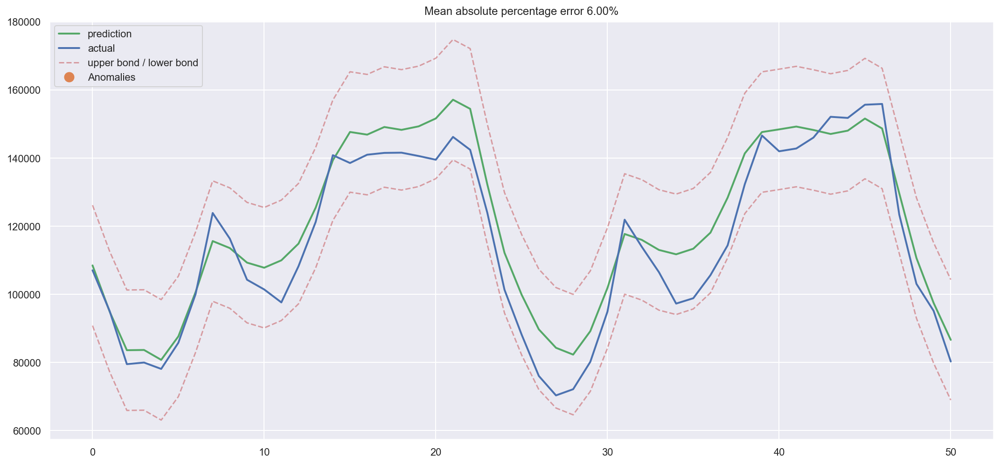

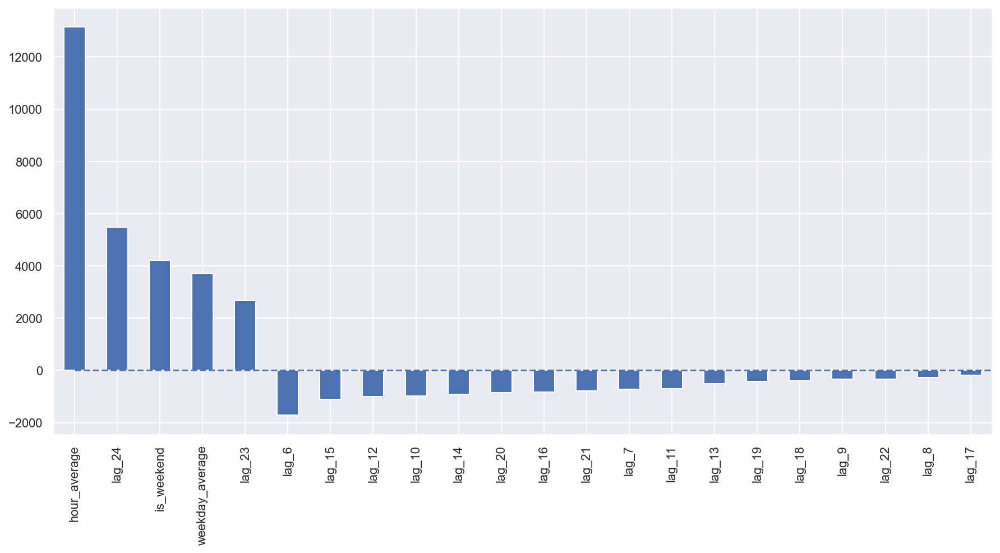

In [68]:
from sklearn.linear_model import LassoCV, RidgeCV

ridge = RidgeCV(cv=tscv)
ridge.fit(X_train_scaled, y_train)

plotModelResults(
    ridge,
    X_train=X_train_scaled,
    X_test=X_test_scaled,
    plot_intervals=True,
    plot_anomalies=True,
)
plotCoefficients(ridge)

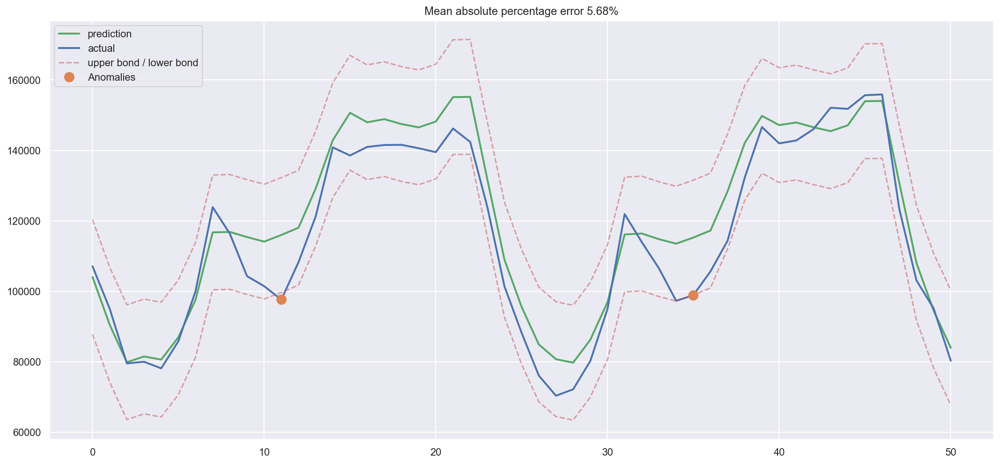

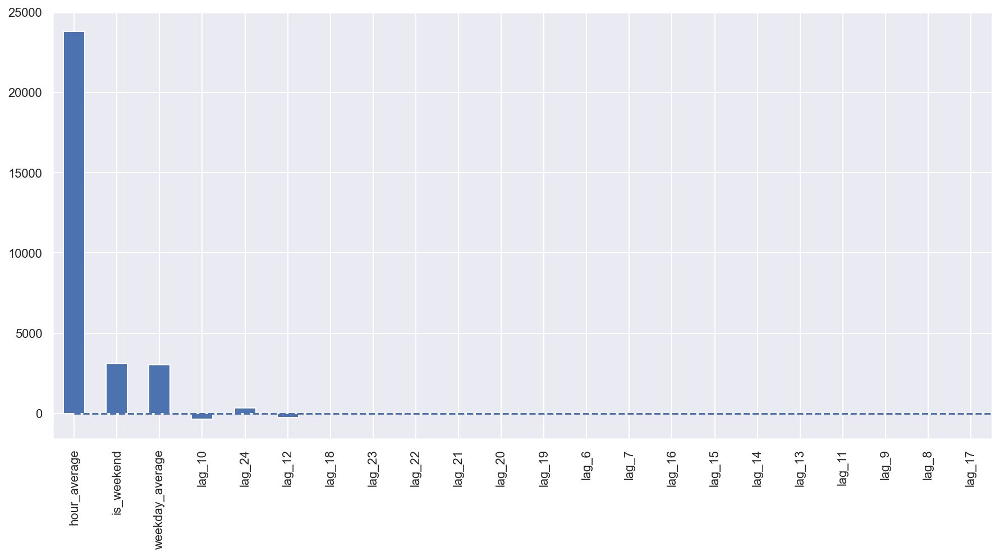

In [69]:
lasso = LassoCV(cv=tscv)
lasso.fit(X_train_scaled, y_train)

plotModelResults(
    lasso,
    X_train=X_train_scaled,
    X_test=X_test_scaled,
    plot_intervals=True,
    plot_anomalies=True,
)
plotCoefficients(lasso)

Boosting

In [70]:
from xgboost import XGBRegressor

xgb = XGBRegressor(verbosity=0)
xgb.fit(X_train_scaled, y_train);

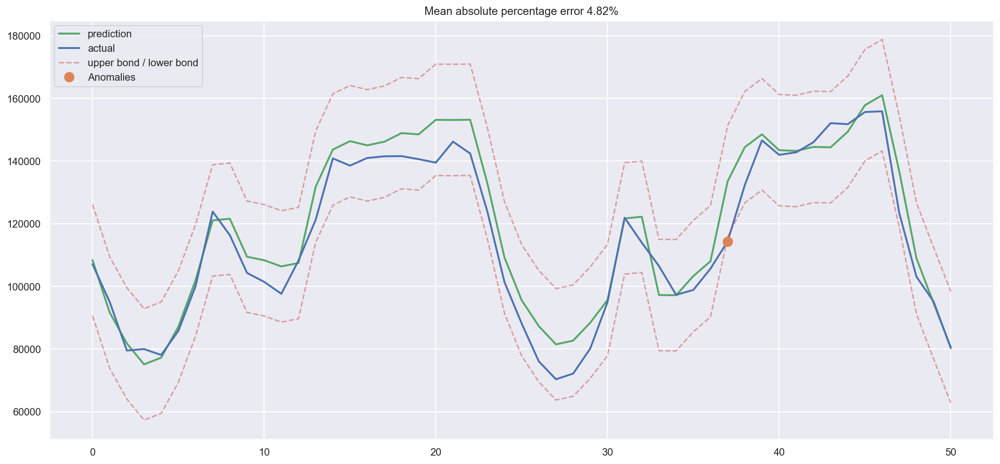

In [71]:
plotModelResults(
    xgb,
    X_train=X_train_scaled,
    X_test=X_test_scaled,
    plot_intervals=True,
    plot_anomalies=True,
)

XGBoost isn't meant to handle time-series data, linear models work better

Conclusion
- aim to find balance between quality and cost
- SARIMA vs linear models

**Using Facebook Prophet, library meant specifically for time series analysis and forecasting**

In its essence, utilizes additive regression model 
- y(t) = g(t) + s(t) + h(t) + e
- g(t) is the trend that models non periodic changes, s(t) models periodic changes in seasonality, h(t) contributs info related to holidays, etc.
- g(t) Trend
    - g(t) = C / (1 + e^-k(t-m)), similar to logistic curve models
- Seasonality s(t)
    - provides flexible model of periodic changes due to weekly/yearly seasonality, through fourier analysis
- Holidays and Events h(t)
    - Predicts abnormal days of the year (Christmas, Black Fridays, etc.)
- Error e(t)
    - represents information not reflected in model, distributed as noise
- Prophet Benchmarking
    - used MAPE (Mean Absolute Percentage Error, MAPE)


In [72]:
pip install fbprophet

  Using cached fbprophet-0.7.1.tar.gz (64 kB)
  ERROR: Command errored out with exit status 1:
   command: /Library/Frameworks/Python.framework/Versions/3.8/bin/python3.8 -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'/private/var/folders/n0/vvd8xktx73s72z3trkvm6c580000gn/T/pip-install-4a0urp4k/fbprophet/setup.py'"'"'; __file__='"'"'/private/var/folders/n0/vvd8xktx73s72z3trkvm6c580000gn/T/pip-install-4a0urp4k/fbprophet/setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d /private/var/folders/n0/vvd8xktx73s72z3trkvm6c580000gn/T/pip-wheel-omsdls37
       cwd: /private/var/folders/n0/vvd8xktx73s72z3trkvm6c580000gn/T/pip-install-4a0urp4k/fbprophet/
  Complete output (39 lines):
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build/lib
  creating build/lib/fbprophet
  creating build/lib/fbprophet/stan_model

Failed to build fbprophet
    Running setup.py install for fbprophet ... error
    ERROR: Command errored out with exit status 1:
     command: /Library/Frameworks/Python.framework/Versions/3.8/bin/python3.8 -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'/private/var/folders/n0/vvd8xktx73s72z3trkvm6c580000gn/T/pip-install-4a0urp4k/fbprophet/setup.py'"'"'; __file__='"'"'/private/var/folders/n0/vvd8xktx73s72z3trkvm6c580000gn/T/pip-install-4a0urp4k/fbprophet/setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' install --record /private/var/folders/n0/vvd8xktx73s72z3trkvm6c580000gn/T/pip-record-j_4dyd81/install-record.txt --single-version-externally-managed --compile --install-headers /Library/Frameworks/Python.framework/Versions/3.8/include/python3.8/fbprophet
         cwd: /private/var/folders/n0/vvd8xktx73s72z3trkvm6c580000gn/T/pip-install-4a0urp4k/fbpro

In [73]:
import os
from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import statsmodels.api as sm
from scipy import stats

import matplotlib.pyplot as plt
#%config InlineBackend.figure_format = 'retina'

In [74]:
def download_file_from_gdrive(file_url, filename, out_path: Path, overwrite=False):
    """
    Downloads a file from GDrive given an URL
    :param file_url: a string formated as https://drive.google.com/uc?id=<file_id>
    :param: the desired file name
    :param: the desired folder where the file will be downloaded to
    :param overwrite: whether to overwrite the file if it already exists
    """
    file_exists = (out_path / filename).exists()

    if (file_exists and overwrite) or (not file_exists):
        os.system(f'gdown {file_url} -O {out_path}/{filename}')

In [76]:
df = pd.read_csv("/Users/aadrijupadya/Downloads/medium_posts.csv")


In [77]:
df

,published,domain,url
0,2012-08-13 22:54:53.510Z,medium.com,https://medium.com/policy/medium-terms-of-serv...
1,2012-08-13 22:57:17.248Z,medium.com,https://medium.com/policy/medium-privacy-polic...
2,2016-11-04 23:40:43.364Z,medium.com,https://medium.com/@Medium/personalize-your-me...
3,2016-12-24 18:21:13.427Z,medium.com,https://medium.com/holiday-poems/xmas-morning-...
4,2015-09-22 21:37:48.207Z,blog.medium.com,https://blog.medium.com/taking-a-side-on-net-n...
...,...,...,...
92186,2017-05-23 17:15:09.193Z,medium.com,https://medium.com/@KyleAndrews1994/its-time-t...
92187,2017-01-31 09:59:12.316Z,medium.com,https://medium.com/silent-protagonist/next-wee...
92188,2017-02-16 14:15:20.116Z,medium.com,https://medium.com/@utapartment26/there-used-t...
92189,2017-06-27 10:16:21.668Z,medium.com,https://medium.com/silent-protagonist/the-snes...


In [79]:
df = df[["published", "url"]].dropna().drop_duplicates()
df["published"] = pd.to_datetime(df["published"])
df.sort_values(by=["published"]).head(n=3)

,published,url
50931,1970-01-01 00:00:00.001000+00:00,https://medium.com/iiot
40243,1970-01-01 00:00:00.001000+00:00,https://medium.com/@ikaella/melon-rebranding-b...
37395,1970-01-18 05:11:46.500000+00:00,http://www.novosti.rs/%D0%B2%D0%B5%D1%81%D1%82...


In [80]:
df = df[
    (df["published"] > "2012-08-15") & (df["published"] < "2017-06-26")
].sort_values(by=["published"])
df.head(n=3)

,published,url
24630,2012-08-15 00:25:03.373000+00:00,https://medium.com/launch-day/jean-attempts-to...
24631,2012-08-15 00:25:29.419000+00:00,https://medium.com/launch-day/dan-and-kristin-...
17811,2012-08-15 00:34:59.502000+00:00,https://medium.com/i-m-h-o/the-world-is-social...


In [81]:
df.tail(n=3)

,published,url
62122,2017-06-25 23:36:01.171000+00:00,https://medium.com/push-the-pace/the-official-...
72471,2017-06-25 23:41:48.295000+00:00,https://medium.com/parti-xyz-developers/%EA%B4...
83283,2017-06-25 23:51:43+00:00,http://www.johanr.com/blog/people-support-dreams


In [82]:
aggr_df = df.groupby("published")[["url"]].count()
aggr_df.columns = ["posts"]

In [83]:
#resampling by aggregating post counts by bins of a date size, and because we are redcing sampling rate of data, we are downsampling
daily_df = aggr_df.resample("D").apply(sum)
daily_df.head(n=3)

,posts
published,
2012-08-15 00:00:00+00:00,16
2012-08-16 00:00:00+00:00,11
2012-08-17 00:00:00+00:00,4


In [85]:
pip install plotly

     |████████████████████████████████| 15.2 MB 4.4 MB/s eta 0:00:01
ERROR: Could not install packages due to an EnvironmentError: [Errno 13] Permission denied: '/Library/Frameworks/Python.framework/Versions/3.8/etc/jupyter/nbconfig/notebook.d/jupyterlab-plotly.json'
Consider using the `--user` option or check the permissions.

You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.8/bin/python3.8 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [86]:
from plotly import graph_objs as go
from plotly.offline import init_notebook_mode, iplot, plot
from IPython.display import display, IFrame

# Initialize plotly
init_notebook_mode(connected=True) 

In [89]:
def plotly_df(df, title="", width=800, height=500):
    """Visualize all the dataframe columns as line plots."""
    common_kw = dict(x=df.index, mode="lines")
    data = [go.Scatter(y=df[c], name=c, **common_kw) for c in df.columns]
    layout = dict(title=title)
    fig = dict(data=data, layout=layout)

    # in a Jupyter Notebook, the following should work
    iplot(fig, show_link=False)

   

In [90]:
plotly_df(daily_df, title="Posts on Medium (daily)")

In [91]:
#to reduce noise, we will resample post counts into weekly bins by using moving-average smoothing and exponential smoothing
weekly_df = daily_df.resample("W").apply(sum)

In [92]:
plotly_df(weekly_df, title="Posts on Medium (weekly)")

In [93]:
daily_df = daily_df.loc[daily_df.index >= "2015-01-01"]
daily_df.head(n=3)

,posts
published,
2015-01-01 00:00:00+00:00,8
2015-01-02 00:00:00+00:00,11
2015-01-03 00:00:00+00:00,11


In [96]:
import logging

from prophet import Prophet

logging.getLogger().setLevel(logging.ERROR)

In [97]:
df = daily_df.reset_index()
df.columns = ["ds", "y"]
# converting timezones (issue https://github.com/facebook/prophet/issues/831)
df["ds"] = df["ds"].dt.tz_convert(None)
df.tail(n=3)

,ds,y
904,2017-06-23,421
905,2017-06-24,277
906,2017-06-25,253


In [98]:
prediction_size = 30
train_df = df[:-prediction_size]
train_df.tail(n=3)

,ds,y
874,2017-05-24,375
875,2017-05-25,298
876,2017-05-26,269


In [99]:
m = Prophet()
m.fit(train_df);

17:16:14 - cmdstanpy - INFO - Chain [1] start processing
17:16:14 - cmdstanpy - INFO - Chain [1] done processing


In [100]:
future = m.make_future_dataframe(periods=prediction_size)
future.tail(n=3)

,ds
904,2017-06-23
905,2017-06-24
906,2017-06-25


In [101]:
forecast = m.predict(future)
forecast.tail(n=3)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
904,2017-06-23,279.141091,256.480348,305.859019,278.722832,279.530899,2.071816,2.071816,2.071816,3.470071,3.470071,3.470071,-1.398255,-1.398255,-1.398255,0.0,0.0,0.0,281.212907
905,2017-06-24,279.870263,217.903781,270.030122,279.411667,280.272609,-35.236630,-35.236630,-35.236630,-34.022485,-34.022485,-34.022485,-1.214145,-1.214145,-1.214145,0.0,0.0,0.0,244.633633
906,2017-06-25,280.599434,224.724406,272.389585,280.096070,281.023125,-31.609154,-31.609154,-31.609154,-30.578824,-30.578824,-30.578824,-1.030330,-1.030330,-1.030330,0.0,0.0,0.0,248.990280


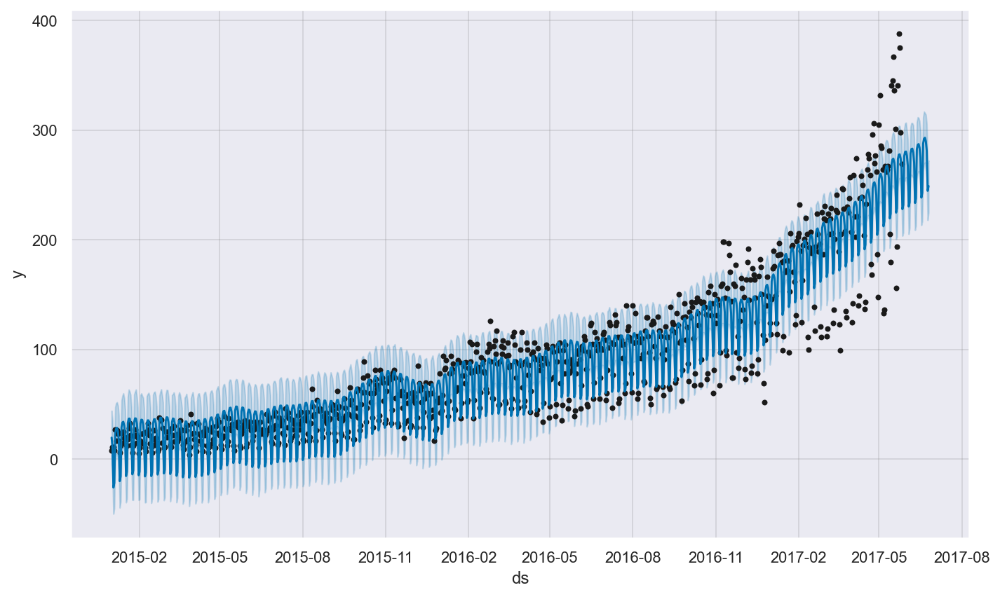

In [102]:
m.plot(forecast);

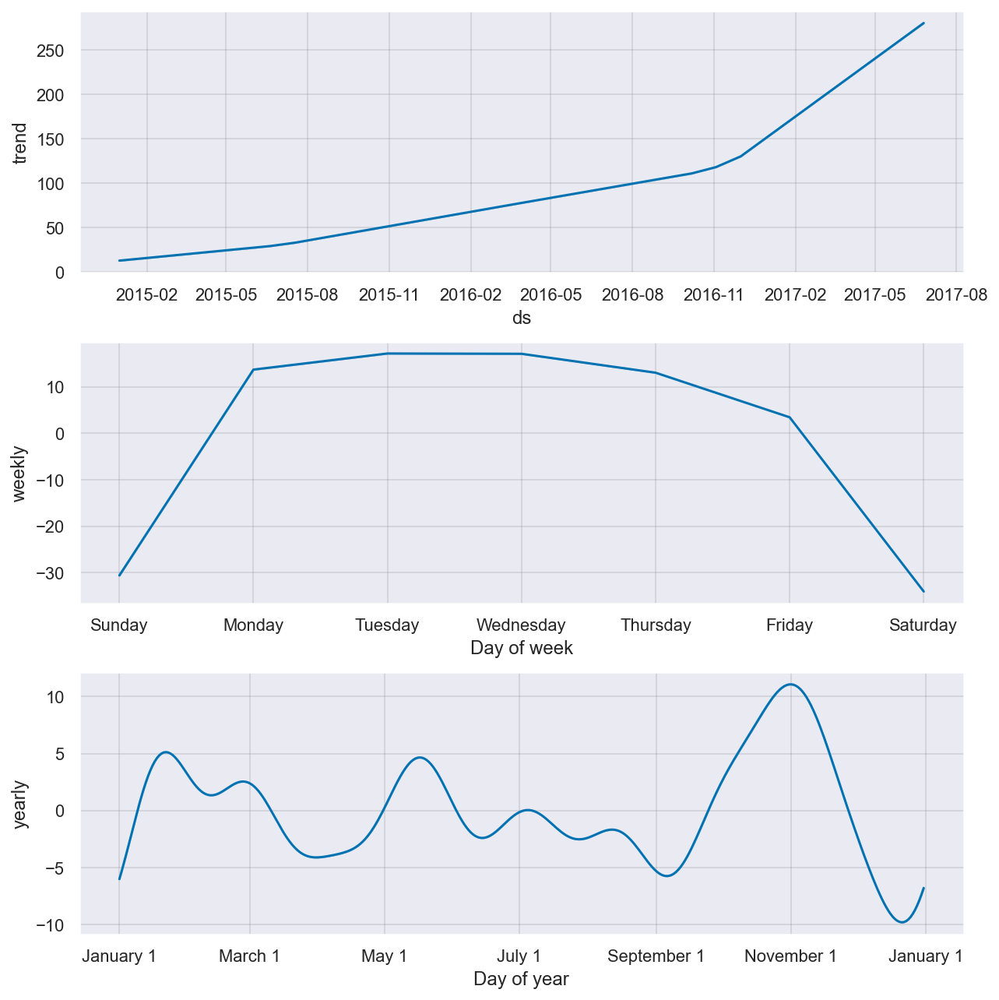

In [103]:
m.plot_components(forecast);

In [104]:
print(", ".join(forecast.columns))

ds, trend, yhat_lower, yhat_upper, trend_lower, trend_upper, additive_terms, additive_terms_lower, additive_terms_upper, weekly, weekly_lower, weekly_upper, yearly, yearly_lower, yearly_upper, multiplicative_terms, multiplicative_terms_lower, multiplicative_terms_upper, yhat


In [106]:
def make_comparison_dataframe(historical, forecast):
    """Join the history with the forecast.

       The resulting dataset will contain columns 'yhat', 'yhat_lower', 'yhat_upper' and 'y'.
    """
    return forecast.set_index("ds")[["yhat", "yhat_lower", "yhat_upper"]].join(
        historical.set_index("ds")
    )

In [107]:
cmp_df = make_comparison_dataframe(df, forecast)
cmp_df.tail(n=3)

,yhat,yhat_lower,yhat_upper,y
ds,,,,
2017-06-23,281.212907,256.480348,305.859019,421
2017-06-24,244.633633,217.903781,270.030122,277
2017-06-25,248.990280,224.724406,272.389585,253


In [108]:
def calculate_forecast_errors(df, prediction_size):
    """Calculate MAPE and MAE of the forecast.

       Args:
           df: joined dataset with 'y' and 'yhat' columns.
           prediction_size: number of days at the end to predict.
    """

    # Make a copy
    df = df.copy()

    # Now we calculate the values of e_i and p_i according to the formulas given in the article above.
    df["e"] = df["y"] - df["yhat"]
    df["p"] = 100 * df["e"] / df["y"]

    # Recall that we held out the values of the last `prediction_size` days
    # in order to predict them and measure the quality of the model.

    # Now cut out the part of the data which we made our prediction for.
    predicted_part = df[-prediction_size:]

    # Define the function that averages absolute error values over the predicted part.
    error_mean = lambda error_name: np.mean(np.abs(predicted_part[error_name]))

    # Now we can calculate MAPE and MAE and return the resulting dictionary of errors.
    return {"MAPE": error_mean("p"), "MAE": error_mean("e")}

In [109]:
for err_name, err_value in calculate_forecast_errors(cmp_df, prediction_size).items():
    print(err_name, err_value)

MAPE 22.47396170182318
MAE 69.14515708200803


In [111]:
def show_forecast(cmp_df, num_predictions, num_values, title, width=800, height=500):
    """Visualize the forecast."""

    def create_go(name, column, num, **kwargs):
        points = cmp_df.tail(num)
        args = dict(name=name, x=points.index, y=points[column], mode="lines")
        args.update(kwargs)
        return go.Scatter(**args)

    lower_bound = create_go(
        "Lower Bound",
        "yhat_lower",
        num_predictions,
        line=dict(width=0),
        marker=dict(color="gray"),
    )
    upper_bound = create_go(
        "Upper Bound",
        "yhat_upper",
        num_predictions,
        line=dict(width=0),
        marker=dict(color="gray"),
        fillcolor="rgba(68, 68, 68, 0.3)",
        fill="tonexty",
    )
    forecast = create_go(
        "Forecast", "yhat", num_predictions, line=dict(color="rgb(31, 119, 180)")
    )
    actual = create_go("Actual", "y", num_values, marker=dict(color="red"))

    # In this case the order of the series is important because of the filling
    data = [lower_bound, upper_bound, forecast, actual]

    layout = go.Layout(yaxis=dict(title="Posts"), title=title, showlegend=False)
    fig = go.Figure(data=data, layout=layout)

    # in a Jupyter Notebook, the following should work
    iplot(fig, show_link=False)

    

show_forecast(cmp_df, prediction_size, 100, "New posts on Medium")

Box-Cox Transformation
- monotonic data transformation to stabilize variance
- logarithmic transformation

In [112]:
def inverse_boxcox(y, lambda_):
    return np.exp(y) if lambda_ == 0 else np.exp(np.log(lambda_ * y + 1) / lambda_)

In [113]:
train_df2 = train_df.copy().set_index("ds")

In [114]:
train_df2["y"], lambda_prophet = stats.boxcox(train_df2["y"])
train_df2.reset_index(inplace=True)

In [115]:
m2 = Prophet()
m2.fit(train_df2)
future2 = m2.make_future_dataframe(periods=prediction_size)
forecast2 = m2.predict(future2)

17:27:53 - cmdstanpy - INFO - Chain [1] start processing
17:27:54 - cmdstanpy - INFO - Chain [1] done processing


In [116]:
for column in ["yhat", "yhat_lower", "yhat_upper"]:
    forecast2[column] = inverse_boxcox(forecast2[column], lambda_prophet)

In [117]:
cmp_df2 = make_comparison_dataframe(df, forecast2)
for err_name, err_value in calculate_forecast_errors(cmp_df2, prediction_size).items():
    print(err_name, err_value)

MAPE 11.885728697746027
MAE 40.307998144104204


In [118]:
show_forecast(cmp_df, prediction_size, 100, "No transformations")
show_forecast(cmp_df2, prediction_size, 100, "Box–Cox transformation")

Demo Assignment

In [119]:
import os
import warnings

warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import requests
from plotly import __version__
from plotly import graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, plot

print(__version__)  # need 1.9.0 or greater
init_notebook_mode(connected=True)

5.10.0


Helper function to provide us with some plotly abilities

In [120]:
def plotly_df(df, title=""):
    data = []

    for column in df.columns:
        trace = go.Scatter(x=df.index, y=df[column], mode="lines", name=column)
        data.append(trace)

    layout = dict(title=title)
    fig = dict(data=data, layout=layout)
    iplot(fig, show_link=False)

In [121]:
df = pd.read_csv(DATA_PATH + "wiki_machine_learning.csv", sep=" ")
df = df[df["count"] != 0]
df.head()

,date,count,lang,page,rank,month,title
81,2015-01-01,1414,en,Machine_learning,8708,201501,Machine_learning
80,2015-01-02,1920,en,Machine_learning,8708,201501,Machine_learning
79,2015-01-03,1338,en,Machine_learning,8708,201501,Machine_learning
78,2015-01-04,1404,en,Machine_learning,8708,201501,Machine_learning
77,2015-01-05,2264,en,Machine_learning,8708,201501,Machine_learning


In [122]:
df.shape

(383, 7)

In [123]:
df.date = pd.to_datetime(df.date)

In [124]:
plotly_df(df.set_index("date")[["count"]])

In [152]:
from prophet import Prophet

predictions = 30
#assign the size of the comparison dataset
df = df[["date", "count"]]
df.columns = ["ds", "y"]
df.tail()


KeyError: "None of [Index(['date', 'count'], dtype='object')] are in the [columns]"

In [129]:
train_df = df[:-predictions].copy()
#creating training dataframe

In [130]:
m = Prophet()
m.fit(train_df);
#initializing prophet object and fitting it 

17:44:10 - cmdstanpy - INFO - Chain [1] start processing
17:44:10 - cmdstanpy - INFO - Chain [1] done processing


In [131]:
future = m.make_future_dataframe(periods=predictions)
future.tail(n=3)
#create 30 forecasts

,ds
380,2016-01-18
381,2016-01-19
382,2016-01-20


In [132]:
forecast = m.predict(future)
forecast.tail()
#save predictions in a dataframe

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
378,2016-01-16,2974.809126,1701.867535,2503.491805,2955.198331,2991.146838,-861.974711,-861.974711,-861.974711,-861.974711,-861.974711,-861.974711,0.0,0.0,0.0,2112.834415
379,2016-01-17,2980.146716,1853.383950,2678.526951,2959.172734,2997.351619,-720.945291,-720.945291,-720.945291,-720.945291,-720.945291,-720.945291,0.0,0.0,0.0,2259.201424
380,2016-01-18,2985.484306,2879.896683,3688.197293,2963.275348,3003.847832,281.432297,281.432297,281.432297,281.432297,281.432297,281.432297,0.0,0.0,0.0,3266.916602
381,2016-01-19,2990.821895,3158.408489,3956.688895,2967.324569,3010.179464,541.623035,541.623035,541.623035,541.623035,541.623035,541.623035,0.0,0.0,0.0,3532.444930
382,2016-01-20,2996.159485,2994.608230,3806.406158,2971.024572,3016.849414,425.717294,425.717294,425.717294,425.717294,425.717294,425.717294,0.0,0.0,0.0,3421.876780


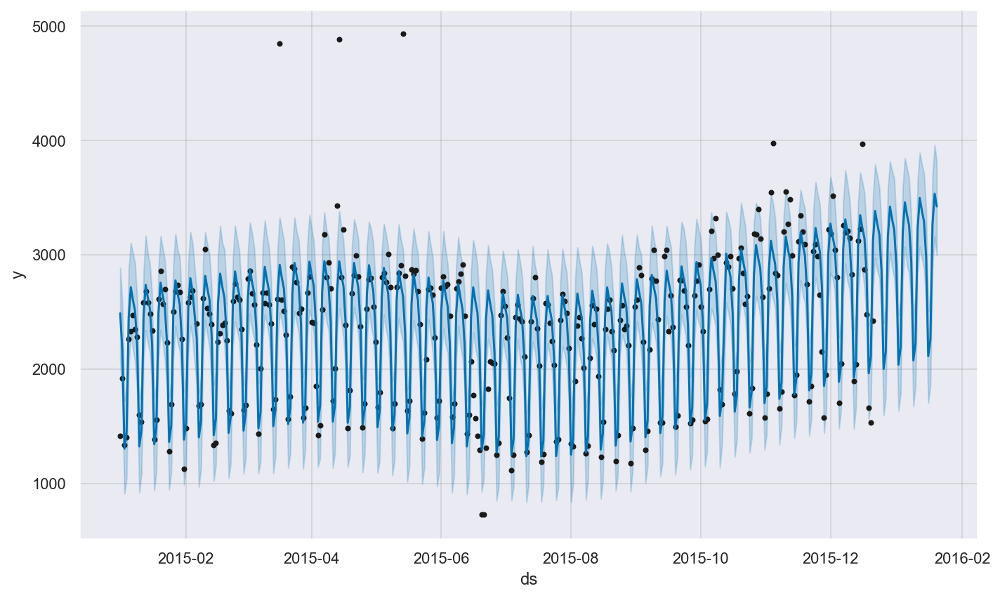

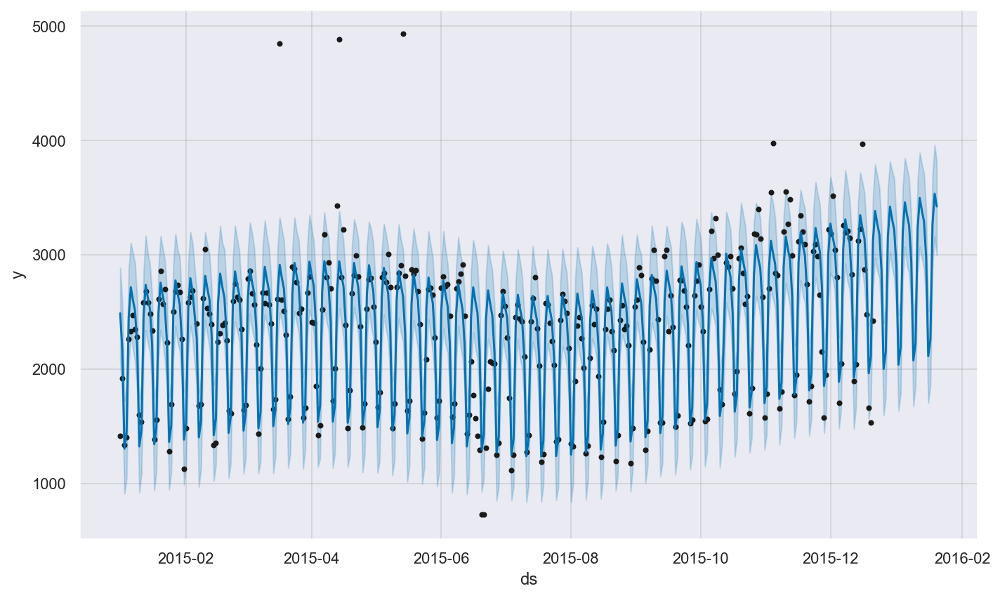

In [133]:
m.plot(forecast)
#quite noisy

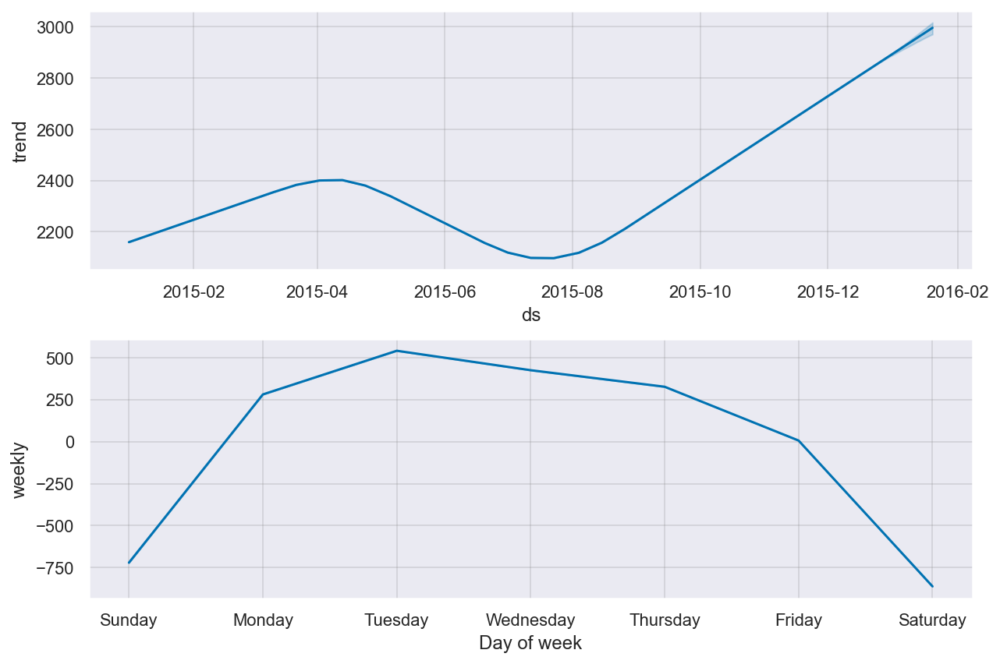

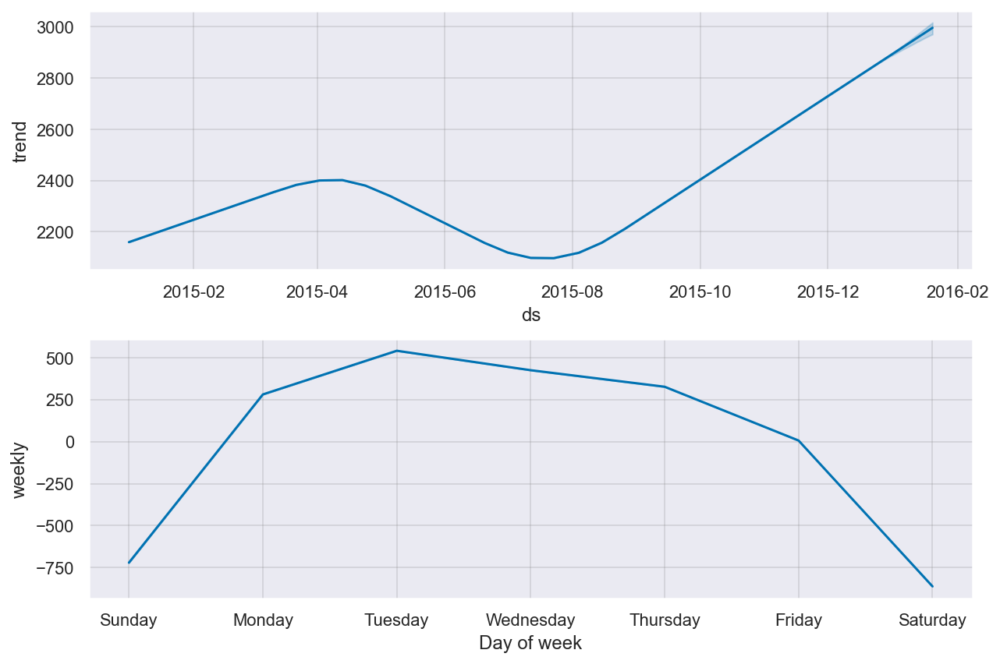

In [134]:
m.plot_components(forecast)
#easier to view analysis of components

In [135]:
cmp_df = forecast.set_index("ds")[["yhat", "yhat_lower", "yhat_upper"]].join(
    df.set_index("ds")
)
#comparison dataframe which has actual values

In [136]:
cmp_df["e"] = cmp_df["y"] - cmp_df["yhat"]
cmp_df["p"] = 100 * cmp_df["e"] / cmp_df["y"]
print("MAPE = ", round(np.mean(abs(cmp_df[-predictions:]["p"])), 2))
print("MAE = ", round(np.mean(abs(cmp_df[-predictions:]["e"])), 2))
#creating our metrics, MAPE = mean absolute percentage error, MAE = mean absolute error

MAPE =  34.34
MAE =  596.38


In [137]:
%matplotlib inline
import matplotlib.pyplot as plt
import statsmodels.api as sm
from scipy import stats

plt.rcParams["figure.figsize"] = (15, 10)

Dickey-Fuller test: p=0.107392


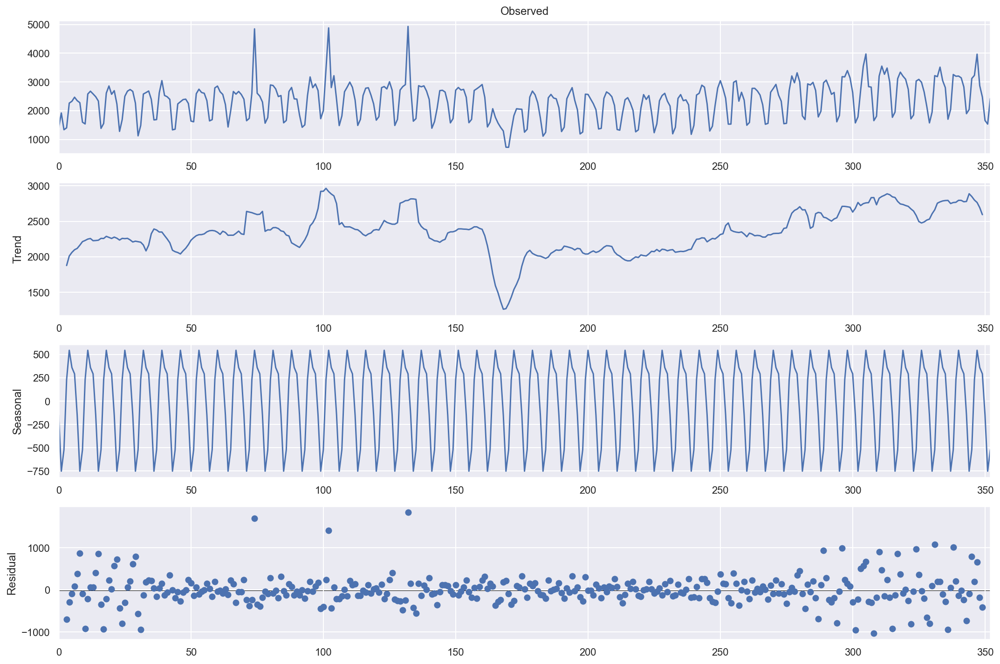

In [139]:
sm.tsa.seasonal_decompose(train_df["y"].values, period=7).plot()
print("Dickey-Fuller test: p=%f" % sm.tsa.stattools.adfuller(train_df["y"])[1])
#Dickey-Fuller test tell us if data is stationary or not

In [140]:
train_df.set_index("ds", inplace=True)

Dickey-Fuller test: p=0.000000


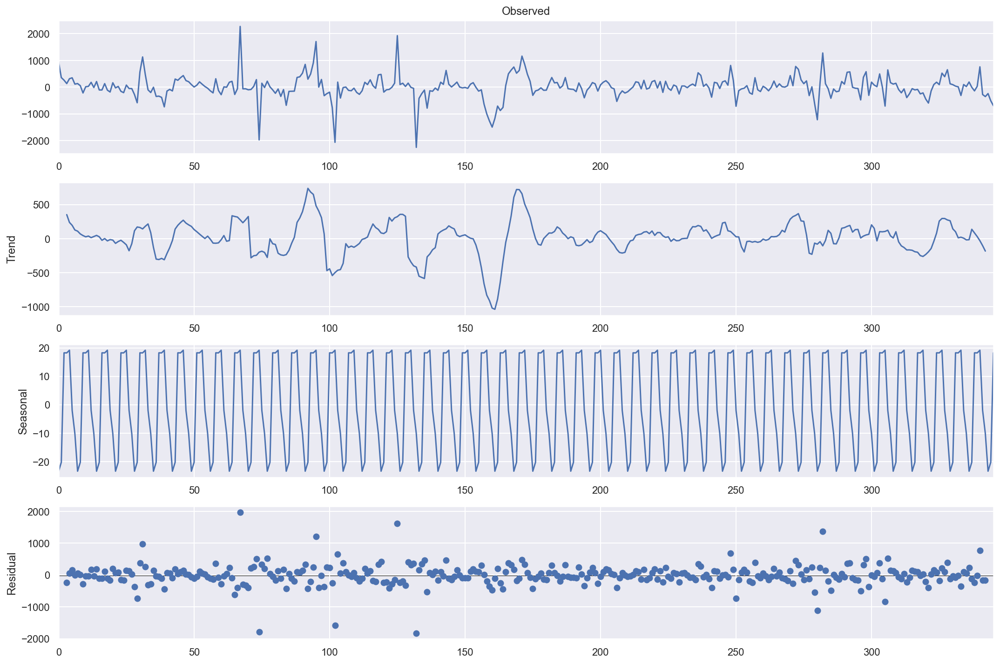

In [141]:
train_df["y_diff"] = train_df.y - train_df.y.shift(7)
sm.tsa.seasonal_decompose(train_df.y_diff[7:].values, period=7).plot()
print("Dickey-Fuller test: p=%f" % sm.tsa.stattools.adfuller(train_df.y_diff[8:])[1])
#however, if we decompose by season, our data seems to be stationary

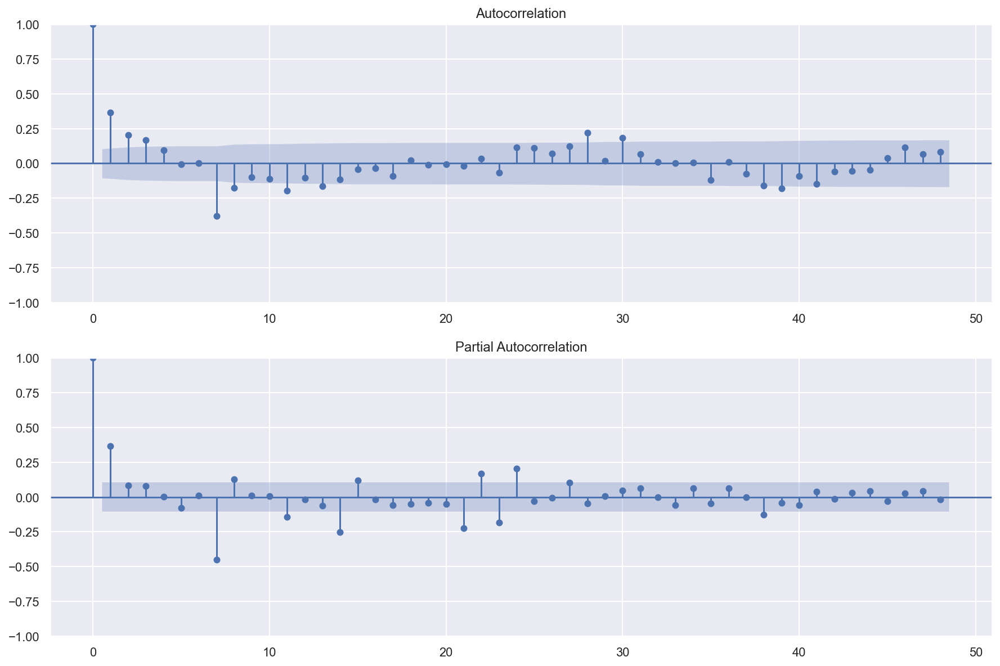

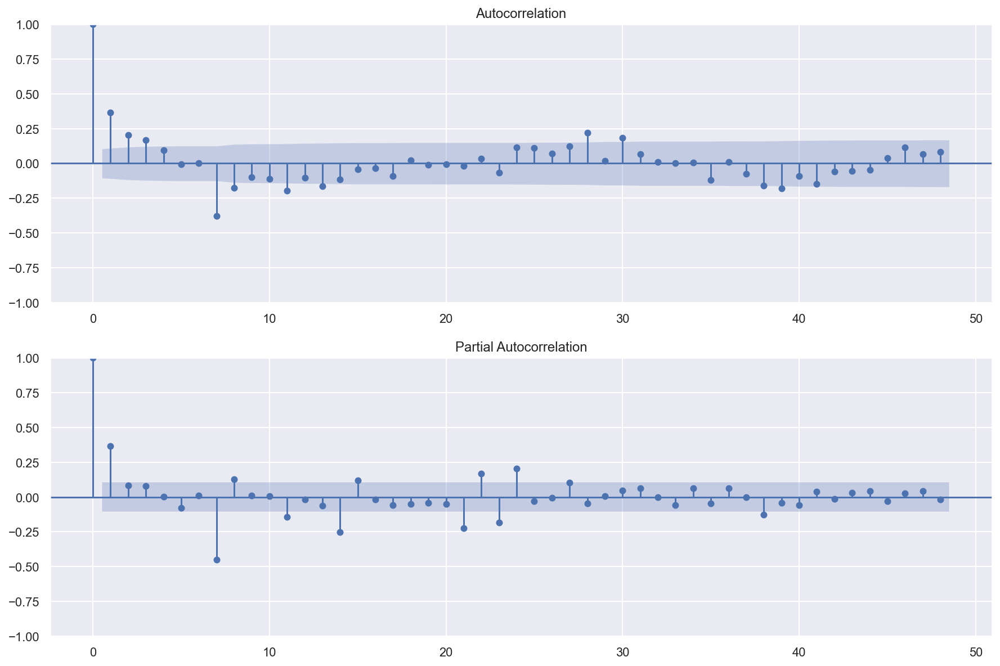

In [142]:
ax = plt.subplot(211)
sm.graphics.tsa.plot_acf(train_df.y_diff[13:].values.squeeze(), lags=48, ax=ax)

ax = plt.subplot(212)
sm.graphics.tsa.plot_pacf(train_df.y_diff[13:].values.squeeze(), lags=48, ax=ax)
#Auto-correlation plots tell us what our initial values for ARIMA are

In [144]:
ps = range(0, 2)
ds = range(0, 2)
qs = range(0, 4)
Ps = range(0, 4)
Ds = range(0, 3)
Qs = range(0, 2)

In [145]:
ds

range(0, 2)

In [146]:
from itertools import product

parameters = product(ps, ds, qs, Ps, Ds, Qs)
parameters_list = list(parameters)
len(parameters_list)

384

In [147]:
%%time
import warnings

from tqdm.notebook import tqdm

results1 = []
best_aic = float("inf")
warnings.filterwarnings("ignore")

for param in tqdm(parameters_list):
    # try except is necessary, because on some sets of parameters the model can not be trained
    try:
        model = sm.tsa.statespace.SARIMAX(
            train_df["y"],
            order=(param[0], param[1], param[2]),
            seasonal_order=(param[3], param[4], param[5], 7),
            # train the model as is even if that would lead to a non-stationary / non-invertible model
            # see https://github.com/statsmodels/statsmodels/issues/6225 for details
        ).fit(disp=-1)

    except (ValueError, np.linalg.LinAlgError):
        continue

    aic = model.aic
    # save the best model, aic, parameters
    if aic < best_aic:
        best_model = model
        best_aic = aic
        best_param = param
    results1.append([param, model.aic])
#Tune hyperparameters

  0%|          | 0/384 [00:00<?, ?it/s]

CPU times: user 9min 22s, sys: 22min 46s, total: 32min 8s
Wall time: 5min 5s


In [148]:
result_table1 = pd.DataFrame(results1)
result_table1.columns = ["parameters", "aic"]
print(result_table1.sort_values(by="aic", ascending=True).head())

             parameters          aic
42   (0, 0, 1, 3, 0, 0)    10.000000
61   (0, 0, 2, 2, 0, 1)    12.000000
280  (1, 0, 3, 3, 0, 0)    16.000000
376  (1, 1, 3, 3, 0, 1)   210.366354
165  (0, 1, 2, 3, 2, 1)  4961.632628


In [149]:
result_table1[
    result_table1["parameters"].isin(
        [(1, 0, 2, 3, 1, 0), (1, 1, 2, 3, 2, 1), (1, 1, 2, 3, 1, 1), (1, 0, 2, 3, 0, 0)]
    )
].sort_values(by="aic")

,parameters,aic
356,"(1, 1, 2, 3, 2, 1)",4989.003294
354,"(1, 1, 2, 3, 1, 1)",5019.555903
258,"(1, 0, 2, 3, 1, 0)",5022.312524
256,"(1, 0, 2, 3, 0, 0)",5183.820172


In [150]:
import scipy.stats

train_df["y_box"], lmbda = scipy.stats.boxcox(train_df["y"])
print("The optimal Box-Cox transformation parameter: %f" % lmbda)
#Apply boxcox transformation to improve performance

The optimal Box-Cox transformation parameter: 0.732841


In [151]:
results2 = []
best_aic = float("inf")

for param in tqdm(parameters_list):
    # try except is necessary, because on some sets of parameters the model can not be trained
    try:
        model = sm.tsa.statespace.SARIMAX(
            train_df["y_box"],
            order=(param[0], param[1], param[2]),
            seasonal_order=(param[3], param[4], param[5], 7),
            # train the model as is even if that would lead to a non-stationary / non-invertible model
            # see https://github.com/statsmodels/statsmodels/issues/6225 for details
            enforce_stationary=False,  
            enforce_invertibility=False  
        ).fit(disp=-1)

    except (ValueError, np.linalg.LinAlgError):
        continue

    aic = model.aic
    # save the best model, aic, parameters
    if aic < best_aic:
        best_model = model
        best_aic = aic
        best_param = param
    results2.append([param, model.aic])

warnings.filterwarnings("default")

  0%|          | 0/384 [00:00<?, ?it/s]

In [153]:
result_table2 = pd.DataFrame(results2)
result_table2.columns = ["parameters", "aic"]
print(result_table2.sort_values(by="aic", ascending=True).head())

             parameters          aic
42   (0, 0, 1, 3, 0, 0)    10.000000
376  (1, 1, 3, 3, 0, 0)    63.929950
261  (1, 0, 2, 3, 2, 1)  3528.443819
285  (1, 0, 3, 3, 2, 1)  3529.820329
213  (1, 0, 0, 3, 2, 1)  3530.231534


In [154]:
result_table2[
    result_table2["parameters"].isin(
        [(1, 0, 2, 3, 1, 0), (1, 1, 2, 3, 2, 1), (1, 1, 2, 3, 1, 1), (1, 0, 2, 3, 0, 0)]
    )
].sort_values(by="aic")

,parameters,aic
258,"(1, 0, 2, 3, 1, 0)",3556.880030
357,"(1, 1, 2, 3, 2, 1)",3558.277490
355,"(1, 1, 2, 3, 1, 1)",3558.624194
256,"(1, 0, 2, 3, 0, 0)",3677.479007


In [155]:
best_model = sm.tsa.statespace.SARIMAX(
    train_df["y_box"],
    order=(1, 0, 2),
    seasonal_order=(3, 2, 1, 7),
    enforce_stationary=False,  
    enforce_invertibility=False  
).fit(disp=-1)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [156]:
print(best_model.summary())

                                      SARIMAX Results                                      
Dep. Variable:                               y_box   No. Observations:                  353
Model:             SARIMAX(1, 0, 2)x(3, 2, [1], 7)   Log Likelihood               -1756.222
Date:                             Tue, 25 Oct 2022   AIC                           3528.444
Time:                                     18:14:50   BIC                           3559.052
Sample:                                          0   HQIC                          3540.641
                                             - 353                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8077      0.125      6.477      0.000       0.563       1.052
ma.L1         -0.3196      

Student's test: p=0.122152
Dickey-Fuller test: p=0.000000


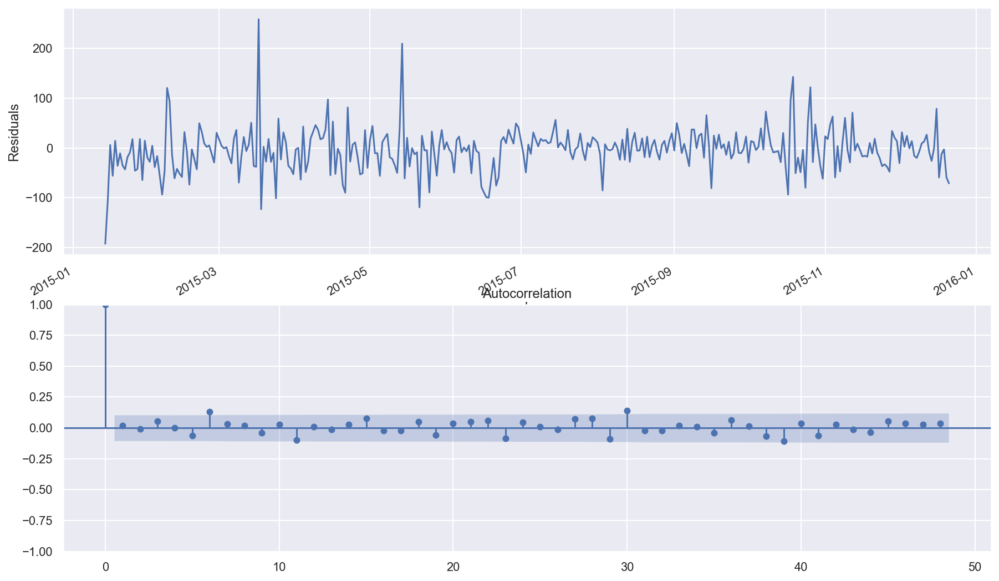

In [157]:
plt.subplot(211)
best_model.resid[13:].plot()
plt.ylabel(u"Residuals")

ax = plt.subplot(212)
sm.graphics.tsa.plot_acf(best_model.resid[13:].values.squeeze(), lags=48, ax=ax)

print("Student's test: p=%f" % stats.ttest_1samp(best_model.resid[13:], 0)[1])
print("Dickey-Fuller test: p=%f" % sm.tsa.stattools.adfuller(best_model.resid[13:])[1])

In [158]:
def invboxcox(y, lmbda):
    # reverse Box Cox transformation
    if lmbda == 0:
        return np.exp(y)
    else:
        return np.exp(np.log(lmbda * y + 1) / lmbda)

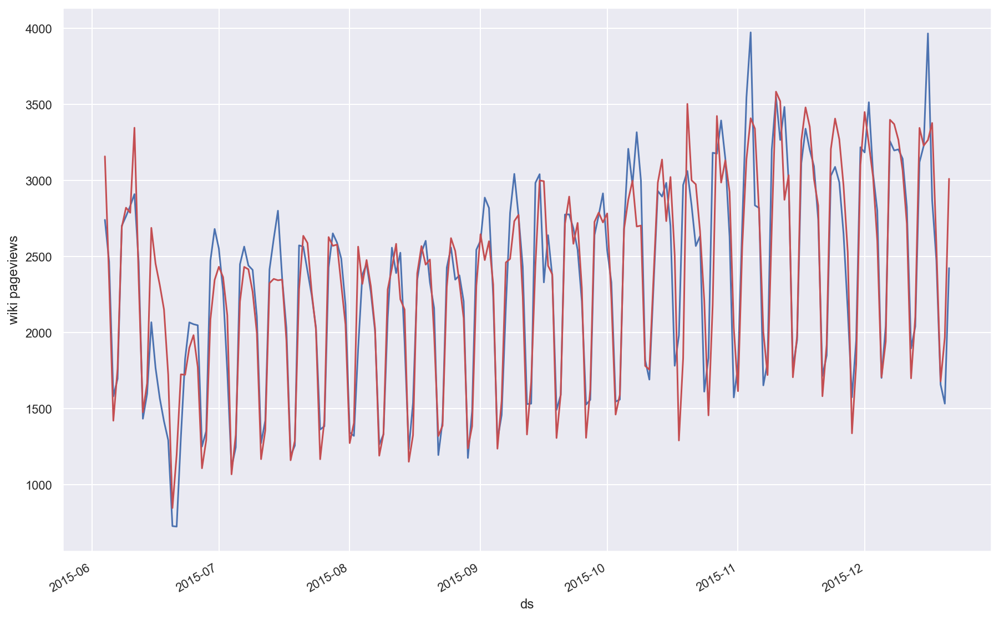

In [159]:
train_df["arima_model"] = invboxcox(best_model.fittedvalues, lmbda)

train_df.y.tail(200).plot()
train_df.arima_model[13:].tail(200).plot(color="r")
plt.ylabel("wiki pageviews");

Final plot with our predicted output over time